![banner](BANNER.png)

# Yolk contractions in fish eggs & embryos - timeseries, period, phase
Paul Gerald Layague Sanchez (pglsanchez@gmail.com)<br>
Laboratory of Aquatic Zoology, Yilan Marine Research Station, Institute of Cellular and Organismic Biology, Academia Sinica, Taiwan

This script performs [wavelet analysis](https://doi.org/10.1101/2020.04.29.067744), and plots (1) the detrended timeseries, (2) period-time analysis, and (3) phase heatmaps of yolk contractions in fish eggs / embryos (in .csv). Timeseries were extracted by taking the mean pixel value of fish eggs / embryos (proxy of projected area of the yolk) over time. Some parts are based on data analyses scripts by Gregor Mönke (https://github.com/tensionhead) and Takehito Tomita (https://github.com/tomitatakehito).

Some chunks of code adapted from entrainment analysis script accessible at https://github.com/PGLSanchez/EMBL_OscillationsAnalysis/tree/bd4a258570e7b7b5f0c179bc976f0d45988efa1a/EntrainmentAnalysis.

Last updated by PGLS on 20231027 1535H

#### Modules are imported here:

In [1]:
from __future__ import division, print_function

import os
from os import path, walk

import sys
sys.path.append(os.path.expanduser("~/PSM/progs/lib/"))

import warnings
warnings.simplefilter('ignore') # switch to warnings.simplefilter('ignore') if want to see warnings

import numpy as np
from numpy import linspace, arange, zeros, array, sqrt, arctan, sin, cos
from numpy.random import normal, uniform, seed
from scipy.signal import savgol_filter
from scipy import ndimage, signal, stats

import pandas as pd
import matplotlib.pylab as ppl
import seaborn as sns
import datetime
import scipy.cluster.hierarchy as hac

from wavelet_analysis import *
from math import *
from matplotlib import rc, gridspec, cm
from mpl_toolkits import mplot3d
from skimage import io
from cycler import cycler
from pathlib import Path

ppl.ion()

#### Parameters are specified here:

In [2]:
wdir = os.getcwd()
print("Working in",wdir)

directory = wdir + '/yolkDynamicsAnalysis/' # directory for output files

data_dir = wdir + '/SAMPLE-DATA-GFvsCPvsZF.csv' # path directory of .txt file, excluding filename.txt

dt = 10 # sampling interval in seconds

offset = 0 # offset on start of experiment, if any

startpoint = 6300 # spf (seconds post-fertilization) at start of imaging
endpoint = 300 # last sampling time point / frame, or number of frames, actual time = startpoint + endpoint*dt

reporter = 'brightfield'
sample_loc = 'SAMPLE-DAT-GFvsCPvsZF' # specify details about the sample (sample data = goldfish (n = 2), carp (n = 2), zebrafish (n = 3))
drug = 'CTRL'
drug_conc = '0'

min_value = -0.015 # for plotting detrended timeseries
max_value = 0.015 # for plotting detrended timeseries

T_c = 850 # set to 250 seconds if analyzing only goldfish samples (here set to 850 seconds because comparing with carp / zebrafish); cut off period, removes low frequency (high period) trends
T_minimum = 80 # minimum period
num_periods = T_c - T_minimum + 1 # number of periods considered

periods = linspace(T_minimum,T_c,num_periods) # (x,y,z) return z evenly spaced periods from x to y seconds
wAn = TFAnalyser(periods, dt, T_cut_off = T_c, vmax = 30) # adjust vmax to adjust the scale of wavelet power for plotting

Working in /Users/pglsanchez/CODE-ContractionsAnalysis


In [3]:
# create a directory for output files

if not os.path.isdir(directory):    
    os.mkdir(directory)
    
if not os.path.isdir(directory + 'detrended_scale'):    
    os.mkdir(directory + 'detrended_scale')

if not os.path.isdir(directory + 'detrendedTimeseries'):    
    os.mkdir(directory + 'detrendedTimeseries')

if not os.path.isdir(directory + 'normalizedData/'):    
    os.mkdir(directory + 'normalizedData/')

if not os.path.isdir(directory + 'order_parameter'):    
    os.mkdir(directory + 'order_parameter')
    
if not os.path.isdir(directory + 'period'):    
    os.mkdir(directory + 'period')
    
if not os.path.isdir(directory + 'phase'):    
    os.mkdir(directory + 'phase')

if not os.path.isdir(directory + 'rawTimeseries/'):    
    os.mkdir(directory + 'rawTimeseries/')

In [4]:
def get_traj(col):
    
    traj = data[col]
    traj.dropna(inplace = True) # return series without null values, do operation in place (inplace=True)
    
    return traj

In [5]:
# configure seaborn

sns.set_style("ticks")
sns.despine()
sns.set_context("talk", font_scale = 1.5)

<Figure size 640x480 with 0 Axes>

In [6]:
rawData = pd.read_csv(data_dir, sep = ',') # read .csv file for oscillations

allTs = pd.DataFrame(index = rawData.index) # tabular data of all periods, with index same as data index
allPs = pd.DataFrame(index = rawData.index) # tabular data of all powers, with index same as data index
allphases = pd.DataFrame(index = rawData.index) # tabular data of all phases, with index same as data index
allamplitudes = pd.DataFrame(index = rawData.index) # tabular data of all amplitudes, with index same as data index

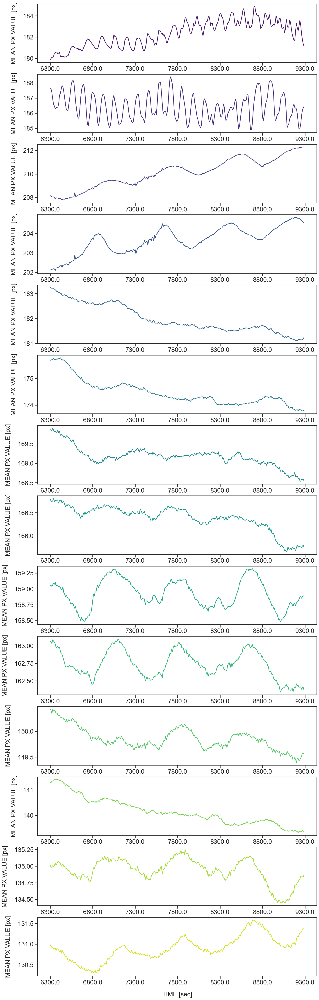

In [7]:
num_samples = len(rawData.columns)-1
sample_color = sns.color_palette("viridis",num_samples).as_hex()

f1,axs = ppl.subplots(num_samples,1, sharex = False, figsize = (16,4*num_samples), num = 1)	# figure with subplots (x,y) - x rows and y columns

for i in range(num_samples):
    
    ax = axs[i]
    j = i + 1 # columns include time column
    ax.plot(rawData.iloc[:,j], '-', lw = 2, alpha = 1, color=sample_color[i])
    ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
    ax.set_ylabel('MEAN PX VALUE [px]', labelpad = 20, fontsize = 20)
    ax.tick_params(axis='both', labelsize = 20)
    #ax.set_xlim([0,endpoint])
    #ax.set_ylim([min_value,max_value])
    ax.set_xticklabels((ax.get_xticks()*dt)+startpoint)

ppl.savefig(str(directory) + 'rawTimeseries/rawTimeseries' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

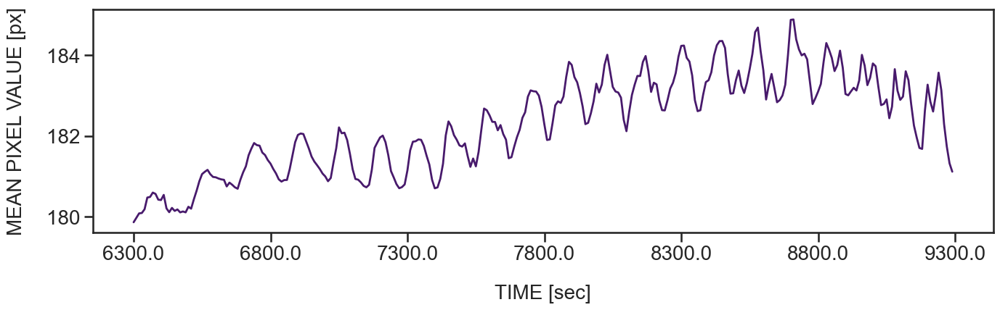

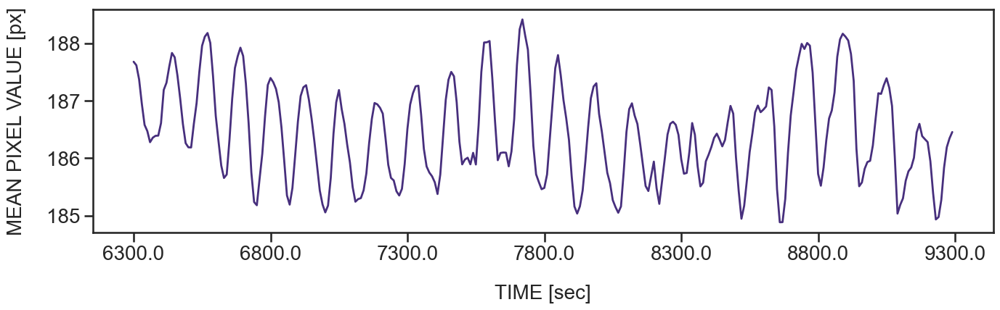

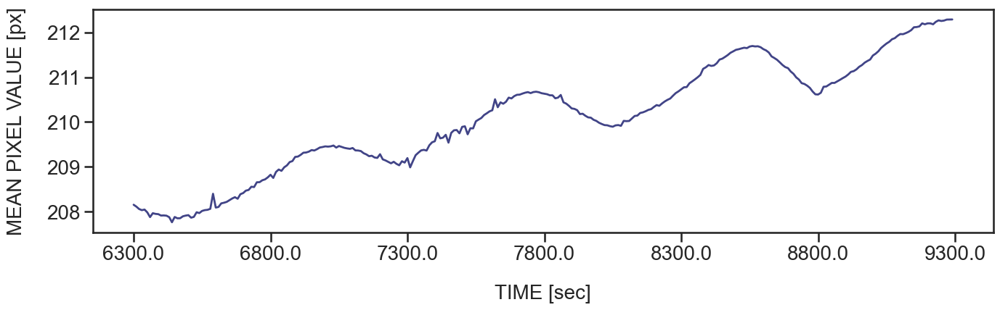

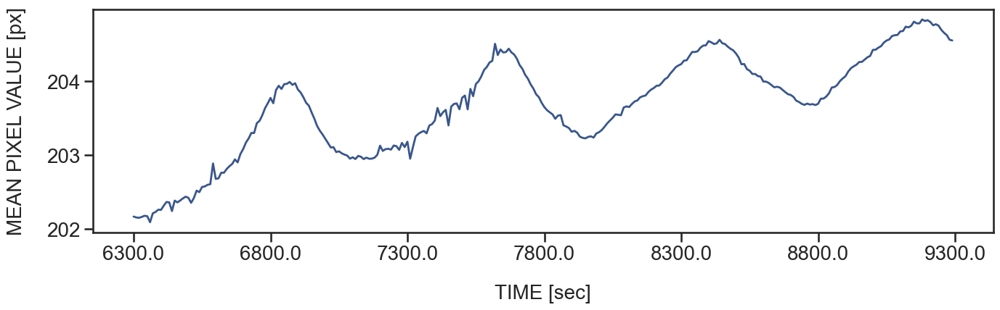

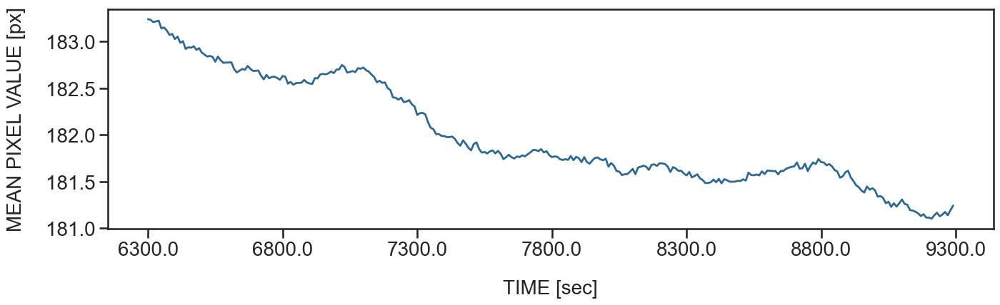

...

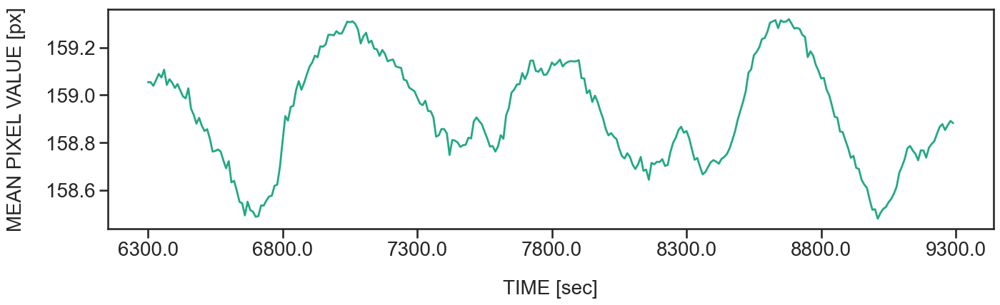

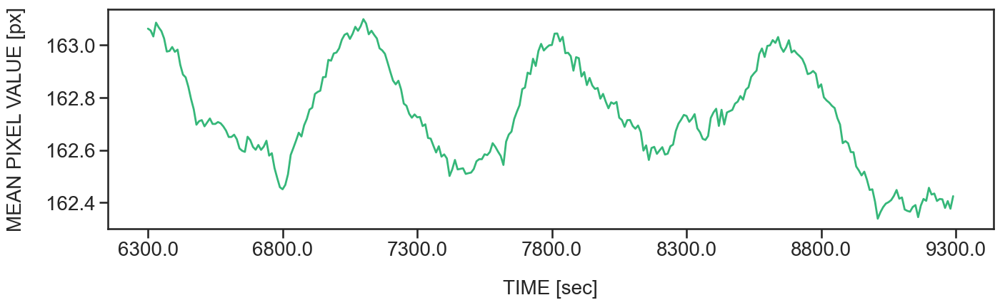

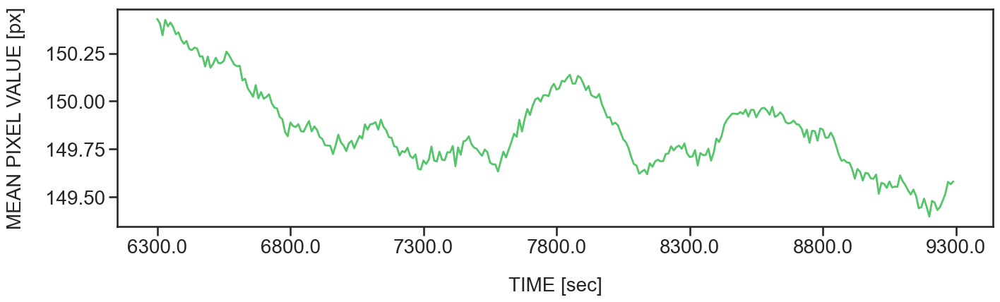

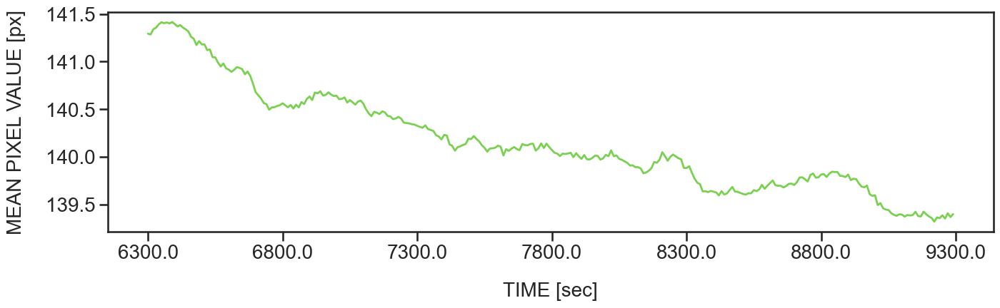

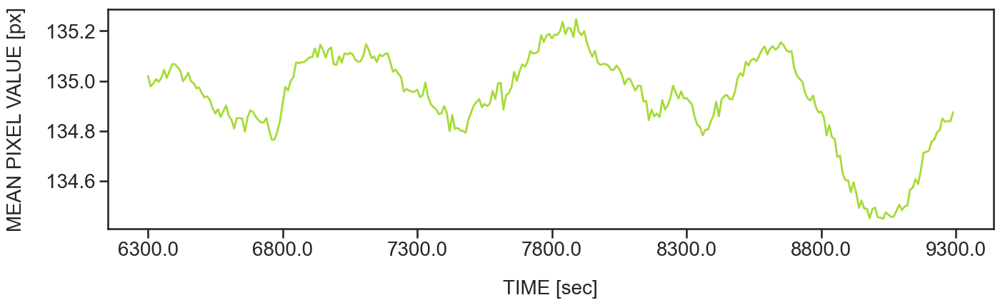

<Figure size 640x480 with 0 Axes>

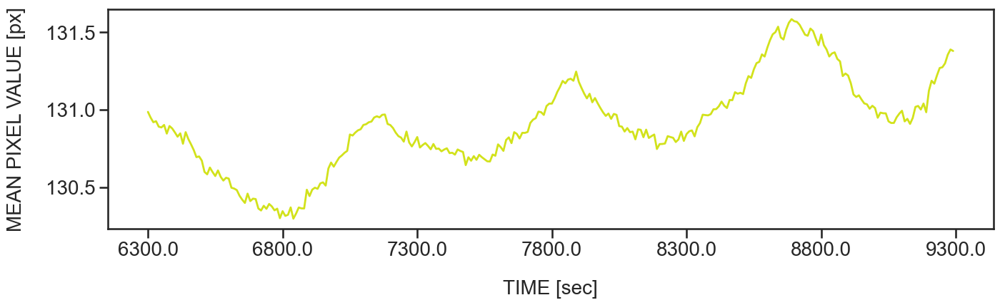

In [8]:
# plot separate raw timeseries for each sample

sample_color = sns.color_palette("viridis",num_samples).as_hex()
    
for i in range(num_samples):
    
    sample_num = i + 1
    fig = ppl.figure(1)
    ppl.figure(figsize=(16,4)) # default size is 8,6
    ppl.clf()
    ax = ppl.gca()
    
    #a = first_pulse
    
    #for n in range(0,endpoint):
    #    if a <= endpoint:
    #        b = a + drug_duration
    #        DETRENDax.axvspan(a, b, alpha = 0.5, color = 'magenta')
    #        a = a + period_pulse
    
    ax.plot(rawData.iloc[:,sample_num], '-', lw = 2, alpha = 1, color=sample_color[i])
    ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
    ax.set_ylabel('MEAN PIXEL VALUE [px]', labelpad = 20, fontsize = 20)
    ax.tick_params(axis='both', labelsize = 20)
    #ax.set_xlim([0,endpoint])
    #ax.set_ylim([min_value,max_value])
    ax.set_xticklabels((ax.get_xticks()*dt)+startpoint)

    
    if sample_num < 10:
        ppl.savefig(str(directory) + 'rawTimeseries/rawTimeseries-singleSample' + '_00' + str(sample_num) + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')
    else:
        ppl.savefig(str(directory) + 'rawTimeseries/rawTimeseries-singleSample' + '_0' + str(sample_num)  + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

In [9]:
# normalize intensities to maximum

max_intensities = rawData.max() # get maximum intensity per sample

data = rawData.copy(deep=True) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.copy.html
for i in range(len(rawData.index)):
        
        for j in range(len(rawData.columns)):
            
            if j != 0:
                
                max_intensity = max_intensities[j]
                data.iloc[i,j] = rawData.iloc[i,j]/max_intensity

# save normalized timeseries
data.to_csv(str(directory) + 'normalizedData/' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.csv')

<Figure size 640x480 with 0 Axes>

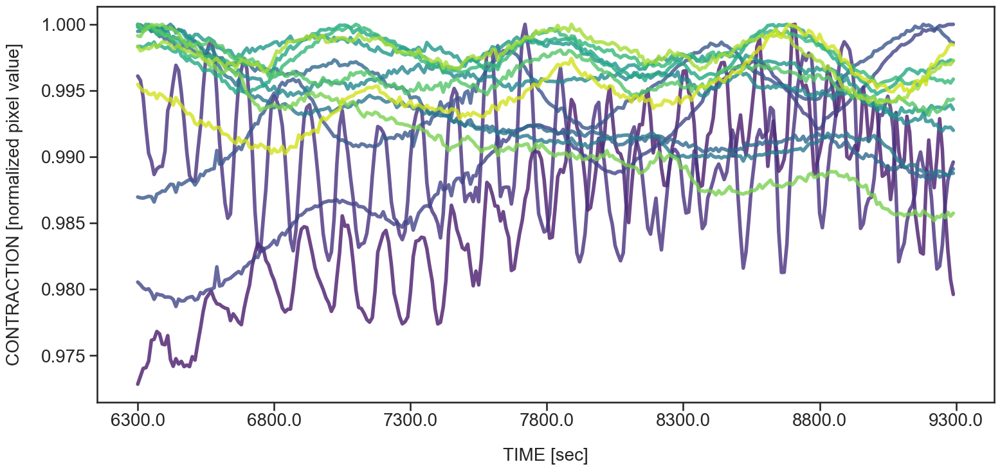

In [10]:
# plot normalized timeseries from start to endpoint

ncolors = len(data.columns) - 1
sample_color = sns.color_palette("viridis",ncolors).as_hex()

fig = ppl.figure(1)
ppl.figure(figsize=(18,8)) # default size is 8,6
ppl.clf()
NORMax = ppl.gca() 

i = 0
for col in data.columns:
    
    i = i + 1
    if 'Process_' not in col: # Process_ in column name -- sample
        continue
    j = i - 1
    k = i - 2
    NORMax.plot(data.iloc[:,j], '-', lw = 4, alpha = 0.8, color=sample_color[k])
    
NORMax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
NORMax.set_ylabel('CONTRACTION [normalized pixel value]', labelpad = 20, fontsize = 20)
NORMax.tick_params(axis='both', labelsize = 20)
NORMax.set_xticklabels((NORMax.get_xticks()*dt)+startpoint)

savefig(str(directory) + 'normalizedData/normalizedData_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

## Plotting the detrended signal

Here the detrended signal of each sample is plotted.

<Figure size 640x480 with 0 Axes>

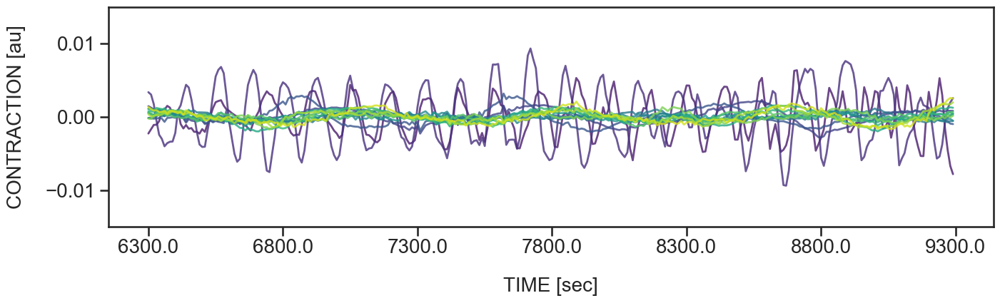

In [11]:
# from start to endpoint

ncolors = len(data.columns) - 1
sns.set_palette("viridis", ncolors)

fig = ppl.figure(1)
ppl.figure(figsize=(16,4)) # default size is 8,6
ppl.clf()
DETRENDax = ppl.gca()

allDetrended = pd.DataFrame(index = data.index) 

for col in data.columns:
    
    if 'Process_' not in col: # W in column name -- sample
        continue
    traj = get_traj(col)
    wAn.compute_spectrum(traj, Plot = False) # if Plot = True, or removed, will show all power spectrum
    detrended_signal = wAn.sinc_detrend()
    
    DETRENDax.plot(detrended_signal, '-', lw = 2, alpha = 0.8)
    
    allDetrended[col] = detrended_signal

#alldetrended_q1 = allDetrended.quantile(q = 0.25, axis = 1) # first quartile of all detrended signal
#alldetrended_q3 = allDetrended.quantile(q = 0.75, axis = 1) # third quartile of all detrended signal
#alldetrended_med = allDetrended.quantile(q = 0.5, axis = 1) # second quartile (median) of all detrended signal

#alldetrended_q1 = savgol_filter(alldetrended_q1, 13,3)
#alldetrended_q3 = savgol_filter(alldetrended_q3, 13,3)
#alldetrended_med = savgol_filter(alldetrended_med, 13,3)    

#DETRENDax.plot(alldetrended_med, '-', c = 'black', alpha = 0.2, lw = 5.0)
#DETRENDax.fill_between(arange(len(alldetrended_q1)), alldetrended_q1, alldetrended_q3, alpha = 0.1, color = 'black') # can add (, label = 'LABEL') inside parentheses (after color) to specify label
DETRENDax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
DETRENDax.set_ylabel('CONTRACTION [au]', labelpad = 20, fontsize = 20)
DETRENDax.tick_params(axis='both', labelsize = 20)
#DETRENDax.set_xlim([0,endpoint])
DETRENDax.set_ylim([min_value,max_value])
DETRENDax.set_xticklabels((DETRENDax.get_xticks()*dt)+startpoint)

savefig(str(directory) + 'detrended_scale/detrended_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

# export detrended timeseries
allDetrended.to_csv(str(directory) + 'detrendedTimeseries/' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.csv')

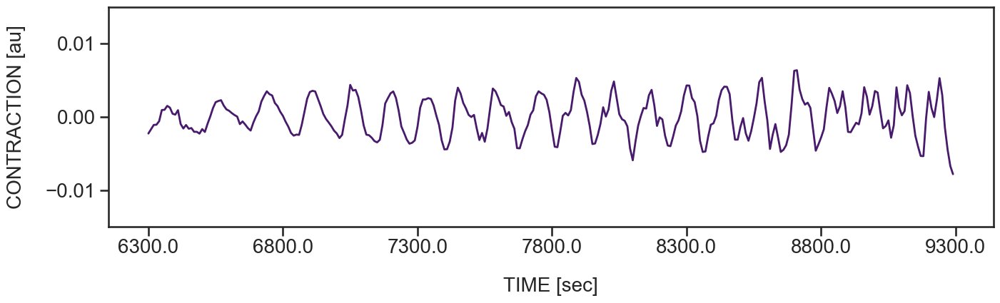

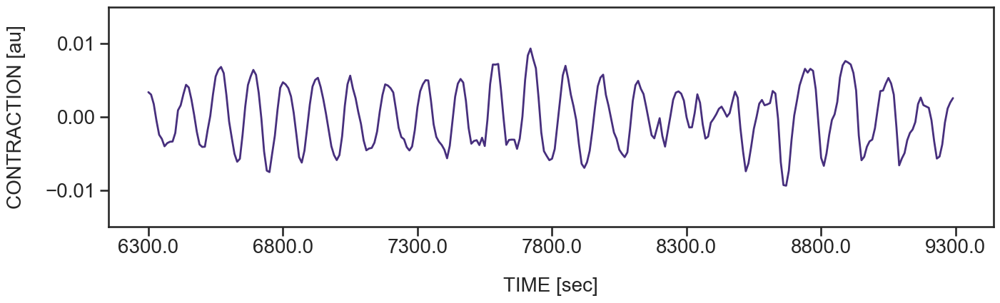

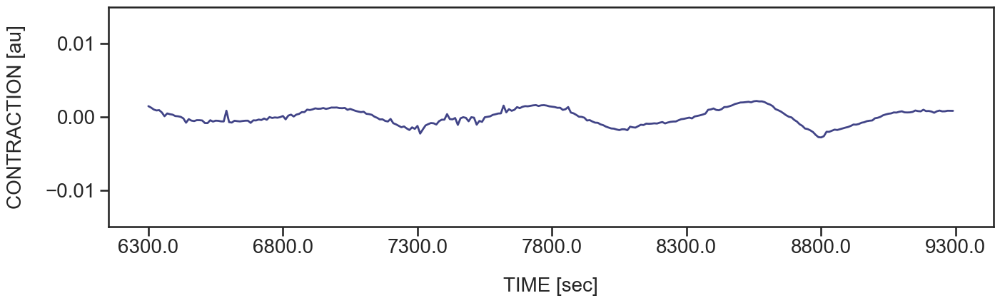

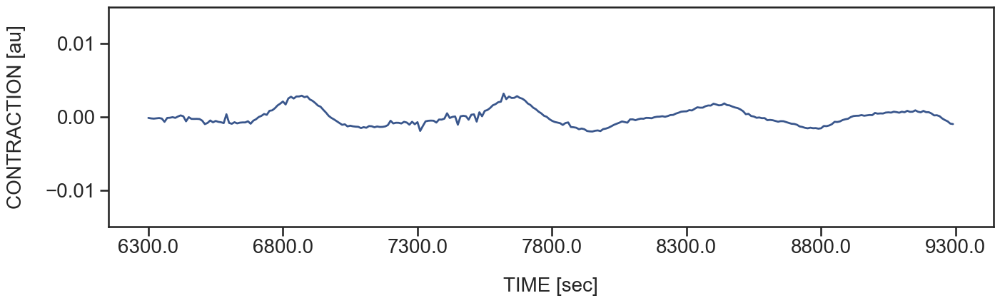

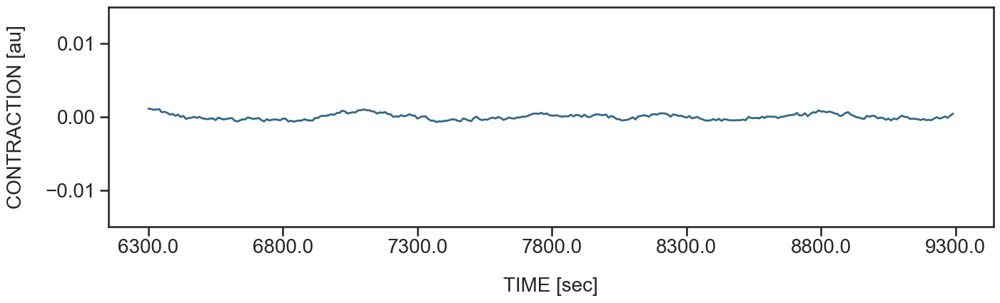

...

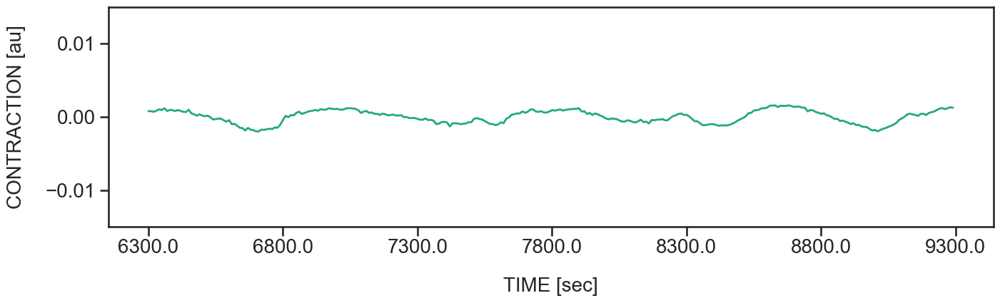

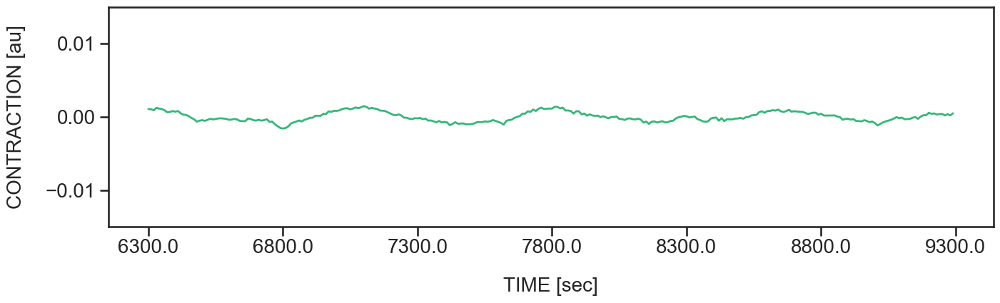

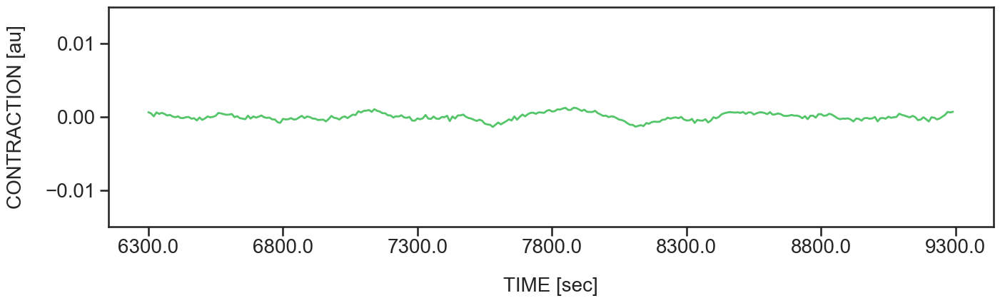

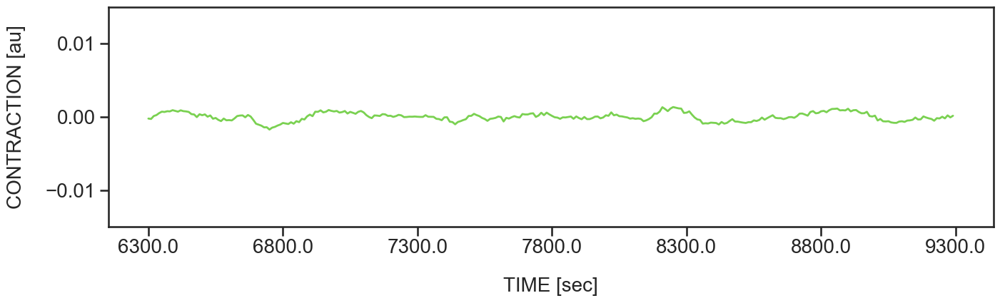

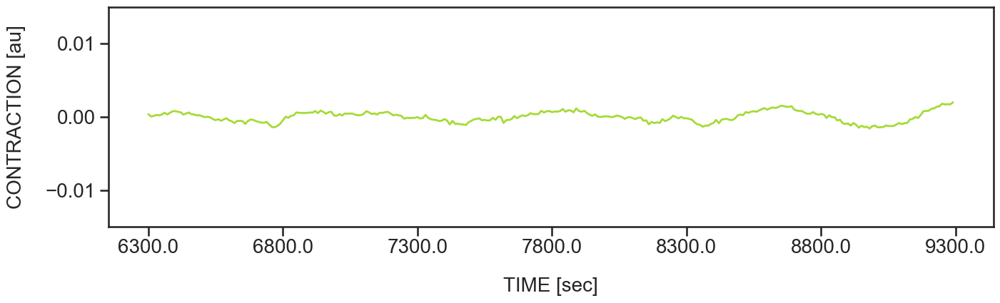

<Figure size 640x480 with 0 Axes>

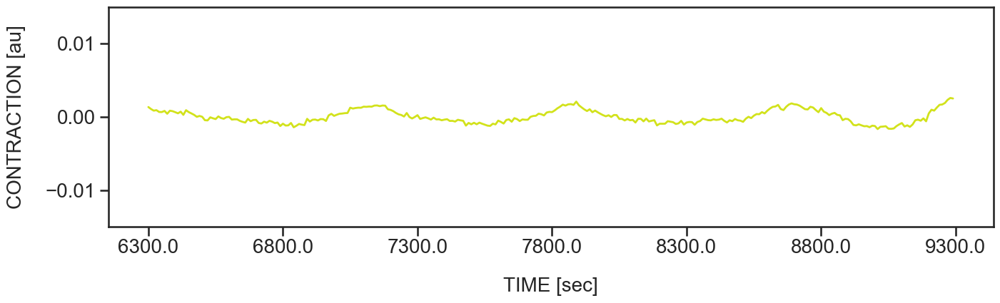

In [12]:
# plot separate detrended timeseries for each sample, 1 sample = 1 file

condition_dir_individualTimeseries = str(directory) + 'detrendedTimeseries/' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc)

if not os.path.isdir(condition_dir_individualTimeseries): 
    os.mkdir(condition_dir_individualTimeseries) # make directory for condition/treatment

sample_color = sns.color_palette("viridis",ncolors).as_hex()
    
for j in range(len(data.columns)-1):
    
    sample_num = j + 1
    fig = ppl.figure(1)
    ppl.figure(figsize=(16,4)) # default size is 8,6
    ppl.clf()
    DETRENDax = ppl.gca()
    
    #a = first_pulse
    
    #for n in range(0,endpoint):
    #    if a <= endpoint:
    #        b = a + drug_duration
    #        DETRENDax.axvspan(a, b, alpha = 0.5, color = 'magenta')
    #        a = a + period_pulse
    
    DETRENDax.plot(allDetrended.iloc[:,j], '-', lw = 2, alpha = 1, color=sample_color[j])
    DETRENDax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
    DETRENDax.set_ylabel('CONTRACTION [au]', labelpad = 20, fontsize = 20)
    DETRENDax.tick_params(axis='both', labelsize = 20)
    #DETRENDax.set_xlim([0,endpoint])
    DETRENDax.set_ylim([min_value,max_value])
    DETRENDax.set_xticklabels((DETRENDax.get_xticks()*dt)+startpoint)

    
    if sample_num < 10:
        ppl.savefig(str(directory) + 'detrended_scale/singleDetrendedTimeseries' + '_00' + str(sample_num) + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')
    else:
        ppl.savefig(str(directory) + 'detrended_scale/singleDetrendedTimeseries' + '_0' + str(sample_num)  + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

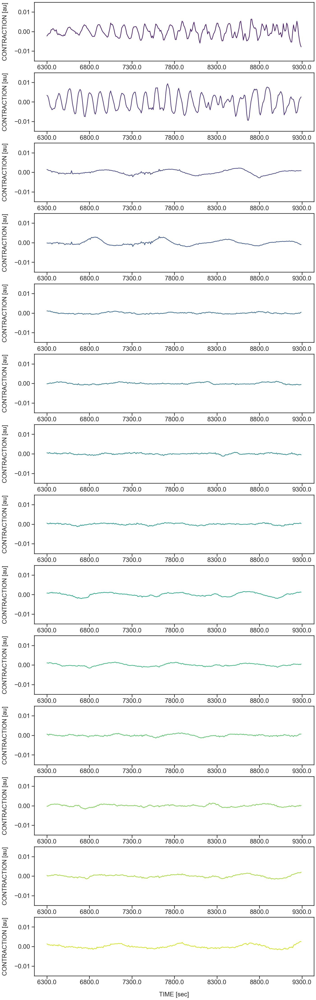

In [13]:
num_samples = len(allDetrended.columns)

f1,axs = ppl.subplots(num_samples,1, sharex = False, figsize = (16,4*num_samples), num = 1)	# figure with subplots (x,y) - x rows and y columns

for i in range(num_samples):
    
    ax = axs[i]
    ax.plot(allDetrended.iloc[:,i], '-', lw = 2, alpha = 1, color=sample_color[i])
    ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
    ax.set_ylabel('CONTRACTION [au]', labelpad = 20, fontsize = 20)
    ax.tick_params(axis='both', labelsize = 20)
    #ax.set_xlim([0,endpoint])
    ax.set_ylim([min_value,max_value])
    ax.set_xticklabels((DETRENDax.get_xticks()*dt)+startpoint)

ppl.savefig(str(directory) + 'detrended_scale/separateDetrendedTimeseries' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

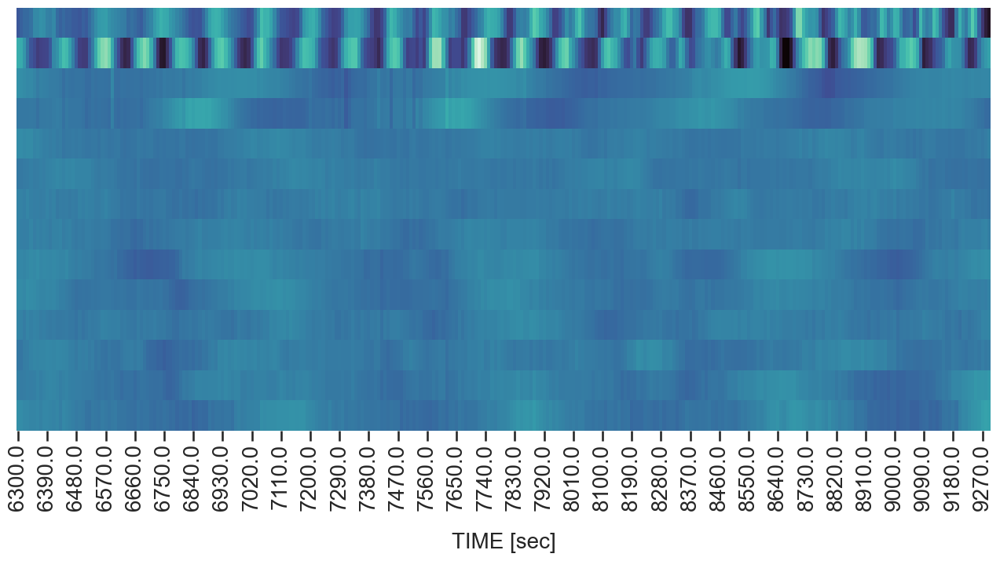

In [14]:
# heatmap based on detrended timeseries

allDetrended_transposed = allDetrended.transpose()

ppl.figure(figsize = (16, 0.5*num_samples))
ppl.clf()
ax = ppl.gca()

ax = sns.heatmap(allDetrended_transposed, cbar=False, cmap="mako")
ax.set_yticks([])
ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax.tick_params(axis='both', labelsize = 20)
ax.set_xticklabels((ax.get_xticks()*dt)+startpoint-5) # - 5 because tickbox is placed in middle of a box for a timepoint (e.g. between observation 1 and observation 2), not accurate because no observation there


ppl.savefig(str(directory) + 'detrended_scale/heatmapDetrendedTimeseries' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

## Time-period analysis using wavelet analysis

Here the change in period during the entrainment experiment is monitored via wavelet analysis. Plotted are the periods (for individual samples, the median, and the interquartile range), and their corresponding wavelet power. The wavelet analysis pipeline used here is developed by Gregor Mönke (https://github.com/tensionhead). For details, please refer to [this manuscript](https://doi.org/10.1101/2020.04.29.067744).

Period with max power of 25.46 in sample  is 138.00
Period with max power of 32.23 in sample  is 147.00
Period with max power of 114.58 in sample  is 751.00
Period with max power of 106.04 in sample  is 760.00
Period with max power of 61.63 in sample  is 760.00
Period with max power of 59.97 in sample  is 844.00
Period with max power of 39.10 in sample  is 843.00
Period with max power of 51.50 in sample  is 724.00
Period with max power of 71.70 in sample  is 788.00
Period with max power of 103.67 in sample  is 759.00
Period with max power of 85.76 in sample  is 694.00
Period with max power of 41.31 in sample  is 584.00
Period with max power of 77.35 in sample  is 735.00
Period with max power of 86.32 in sample  is 759.00
Period with max power of 25.46 in sample  is 138.00
Period with max power of 32.23 in sample  is 147.00
Period with max power of 114.58 in sample  is 751.00
Period with max power of 106.04 in sample  is 760.00
Period with max power of 61.63 in sample  is 760.00
Period 

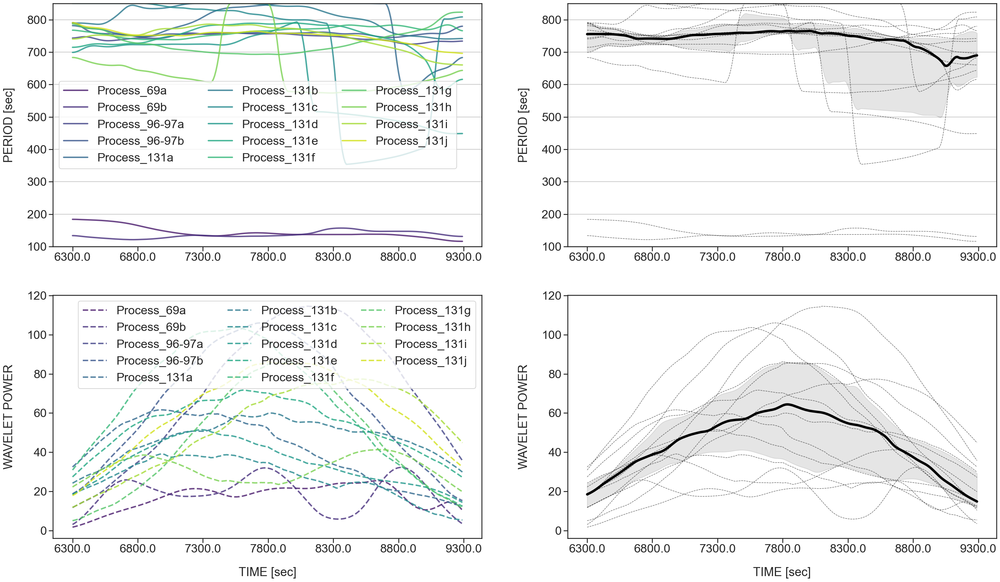

In [15]:
# time-period analysis plots with instantaneous wavelet power for all samples
# not panels on the right plots summary statistics for ALL samples (not separated by different conditions, if any)

ncolors = len(data.columns) - 1
sns.set_palette("viridis", ncolors)

f1,axs1 = ppl.subplots(2,2, sharex = False, figsize = (35,20), num = 1)	# figure with 4 subplots (2,2) - 2 rows and 2 columns
ax1 = axs1[0,0]
ax2 = axs1[1,0]
ax3 = axs1[0,1]
ax4 = axs1[1,1]

for col in data.columns:
    if 'Process_' not in col: # ignore columns that do not correspond to sample trajectories
        continue
    traj = get_traj(col)
    wAn.compute_spectrum(traj, Plot = False)
    rdata = wAn.get_maxRidge() # has arrays for inds, power, ridge, time, and z 
    Ts = rdata['ridge'] # array for periods
    Ps = rdata['power']
    
    s = pd.Series(Ts) # 1d array of periods with axis labels 
    allTs[col] = s

    s = pd.Series(Ps) # 1d array of powers with axis labels
    allPs[col] = s

    ax1.plot(Ts, label = col, lw = 3, alpha = 0.8)
    ax2.plot(Ps, '--', label = col, lw = 3, alpha = 0.8)
    
ax1.legend(ncol = 3)
ax1.set_ylabel('PERIOD [sec]', labelpad = 25, fontsize = 25)
ax1.set_ylim([100,T_c]) # change minimum and maximum y value, period, plotted
ax1.set_xticklabels(ax1.get_xticks()*dt+startpoint)
ax1.yaxis.grid() # horizontal gridlines

ax2.legend(ncol = 3)
ax2.set_ylabel('WAVELET POWER', labelpad = 25, fontsize = 25)
#ax2.set_ylim([0,55])
ax2.set_xlabel('TIME [sec]', labelpad = 25, fontsize = 25)
ax2.set_xticklabels(ax2.get_xticks()*dt+startpoint)

# plot quartile distribution of period across time

allTs_q1 = allTs.quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs_q3 = allTs.quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs_med = allTs.quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs_q1 = savgol_filter(allTs_q1, 13,3)
allTs_q3 = savgol_filter(allTs_q3, 13,3)
allTs_med = savgol_filter(allTs_med, 13,3)

for col in data.columns:
    if 'Process_' not in col: # ignore columns that do not correspond to sample trajectories
        continue
    traj = get_traj(col)
    wAn.compute_spectrum(traj, Plot = False)
    rdata = wAn.get_maxRidge() # has arrays for inds, power, ridge, time, and z 
    Ts = rdata['ridge'] # array for periods
    Ps = rdata['power']
    
    s = pd.Series(Ts) # 1d array of periods with axis labels 
    allTs[col] = s

    s = pd.Series(Ps) # 1d array of powers with axis labels
    allPs[col] = s

    ax3.plot(Ts, '--', lw = 1, alpha = 0.6, color='black')
    ax4.plot(Ps, '--', lw = 1, alpha = 0.6, color = 'black')
    
ax3.plot(allTs_med, '-', c = 'black', alpha = 1.0, lw = 5.0)
ax3.fill_between(arange(len(allTs_q1)), allTs_q1, allTs_q3, alpha = 0.1, color = 'black') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax3.set_ylabel('PERIOD [sec]', labelpad = 25, fontsize = 25)
ax3.set_ylim([100,T_c])  # change minimum and maximum y value, period, plotted
ax3.set_xticklabels(ax3.get_xticks()*dt+startpoint)
ax3.yaxis.grid() # horizontal gridlines

# plot quartile distribution of wavelet power across time

allPs_q1 = allPs.quantile(q = 0.25, axis = 1) # first quartile of all wavelet powers (Ps)
allPs_q3 = allPs.quantile(q = 0.75, axis = 1) # third quartile of all wavelet powers (Ps)
allPs_med = allPs.quantile(q = 0.5, axis = 1) # second quartile = median of all wavelet powers (Ps)

allPs_q1 = savgol_filter(allPs_q1, 13,3)
allPs_q3 = savgol_filter(allPs_q3, 13,3)
allPs_med = savgol_filter(allPs_med, 13,3)

ax4.plot(allPs_med, '-', c = 'black', alpha = 1.0, lw = 5.0)
ax4.fill_between(arange(len(allPs_q1)), allPs_q1, allPs_q3, alpha = 0.1, color = 'black') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax4.set_ylabel('WAVELET POWER', labelpad = 25, fontsize = 25)
#ax4.set_ylim([0,55])
ax4.set_xlabel('TIME [sec]', labelpad = 25, fontsize = 25)
ax4.set_xticklabels(ax4.get_xticks()*dt+startpoint) # you have ticks only for x-axis, alternative to last two lines

savefig(str(directory) + 'period/period' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

Period with max power of 25.46 in sample  is 138.00
Period with max power of 32.23 in sample  is 147.00
Period with max power of 114.58 in sample  is 751.00
Period with max power of 106.04 in sample  is 760.00
Period with max power of 61.63 in sample  is 760.00
Period with max power of 59.97 in sample  is 844.00
Period with max power of 39.10 in sample  is 843.00
Period with max power of 51.50 in sample  is 724.00
Period with max power of 71.70 in sample  is 788.00
Period with max power of 103.67 in sample  is 759.00
Period with max power of 85.76 in sample  is 694.00
Period with max power of 41.31 in sample  is 584.00
Period with max power of 77.35 in sample  is 735.00
Period with max power of 86.32 in sample  is 759.00


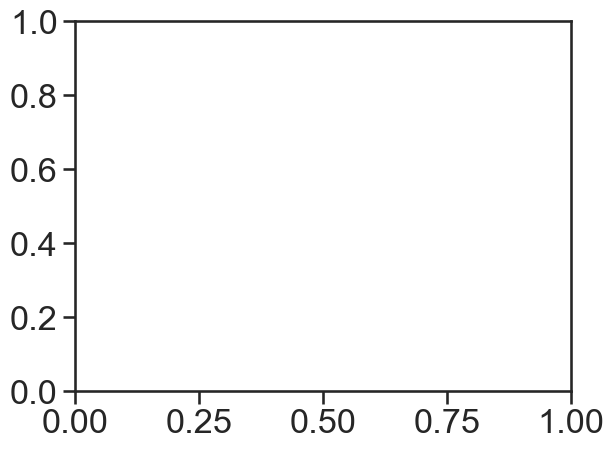

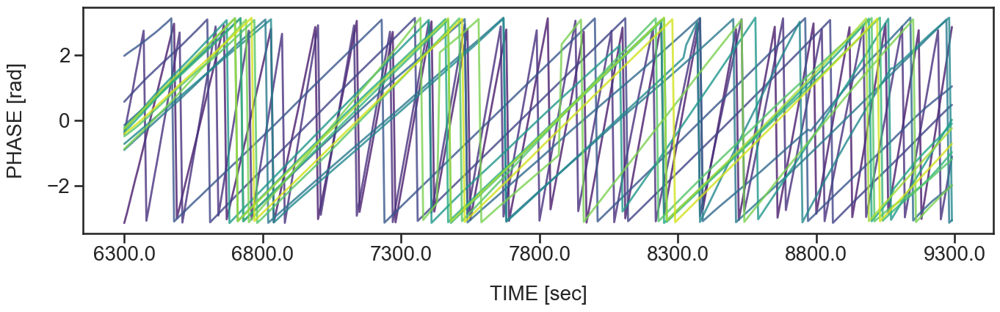

In [16]:
# to extract phase and amplitude using wavelet analysis

for col in data.columns:
    if 'Process_' not in col: # ignore columns that do not correspond to sample trajectories (samples labeled with 'Process_')
        continue
    traj = get_traj(col)
    wAn.compute_spectrum(traj, Plot = False)
    rdata = wAn.get_maxRidge() # has arrays for inds, power, ridge, time, and z 
    phases = np.angle(rdata['z']) # angle of the complex number component
    amplitudes = np.abs(rdata['z']) # magnitude of the complex number component

    s = pd.Series(phases) # 1d array of phases with axis labels
    allphases[col] = s

    r = pd.Series(amplitudes) # 1d array of amplitudes with axis labels
    allamplitudes[col] = r
    
ppl.figure(figsize=(16,4))
PHASEax = ppl.gca()

PHASEax.plot(allphases, lw=2, alpha=0.8)
PHASEax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
PHASEax.set_ylabel('PHASE [rad]', labelpad = 20, fontsize = 20)
PHASEax.tick_params(axis='both', labelsize = 20)
PHASEax.set_xticklabels((PHASEax.get_xticks()*dt)+startpoint)

savefig(str(directory) + 'phase/phase_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

# export phase timeseries
allphases.to_csv(str(directory) + 'phase/phase_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.csv')

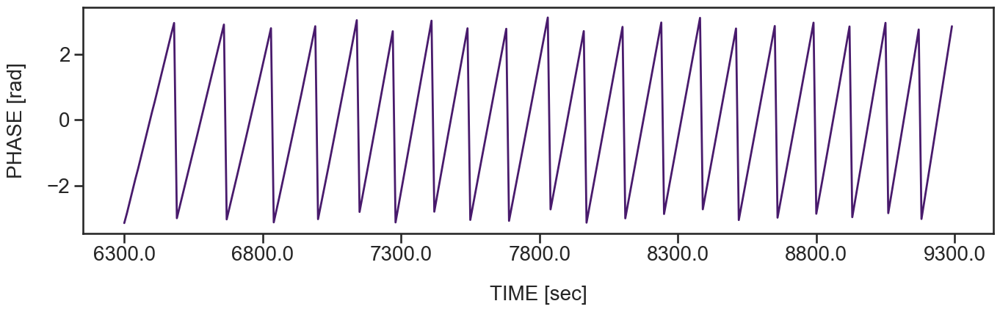

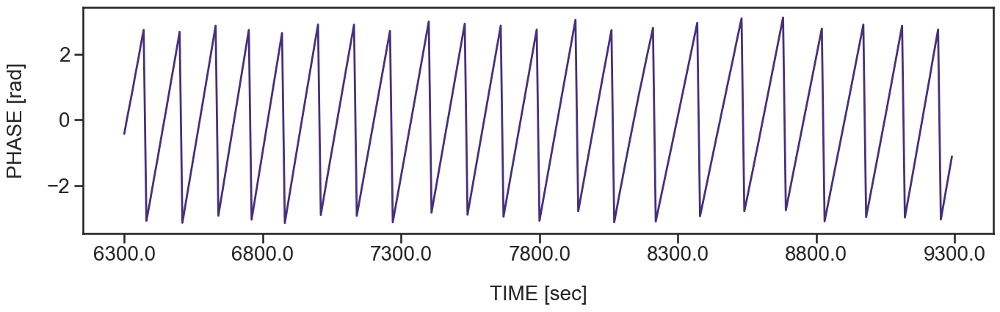

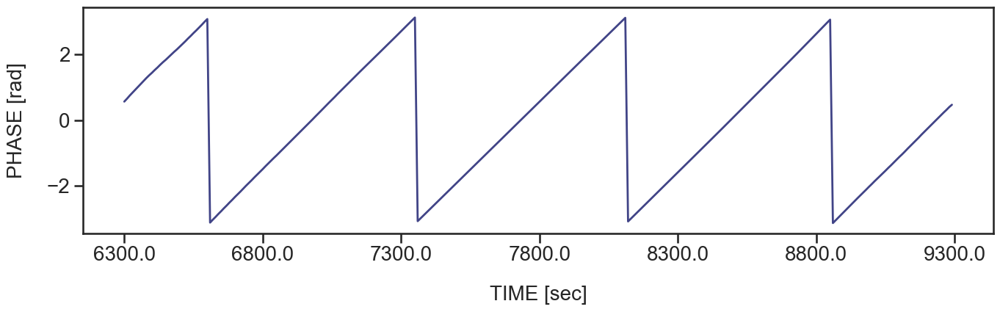

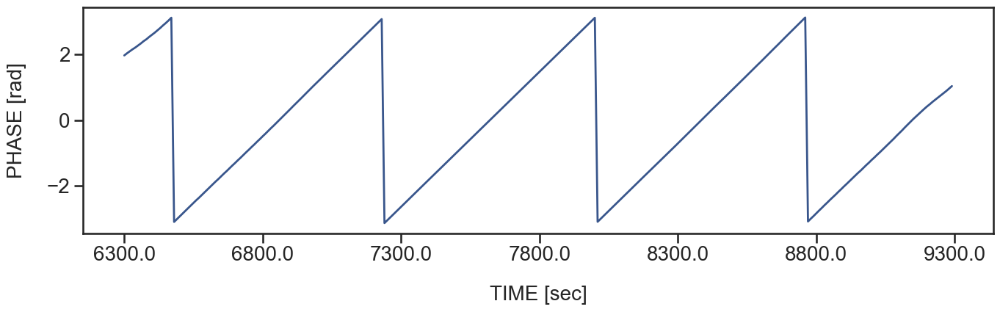

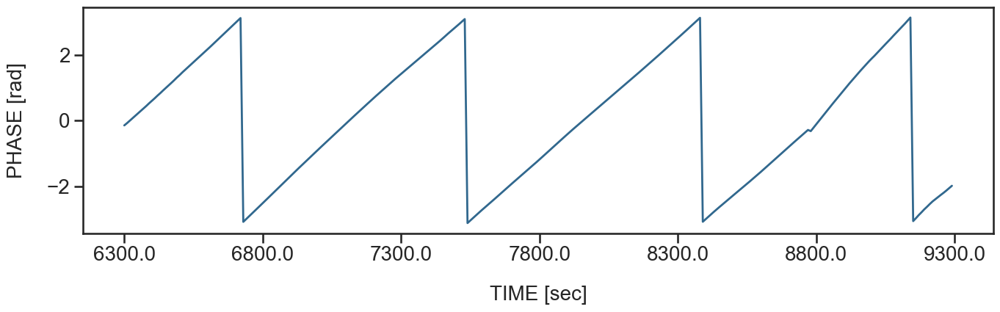

...

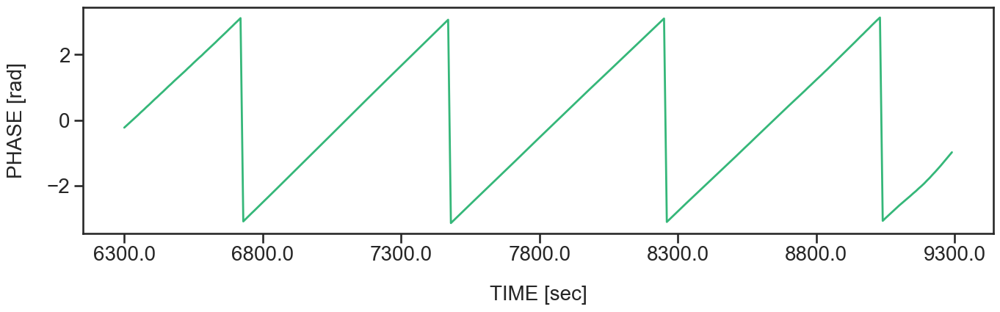

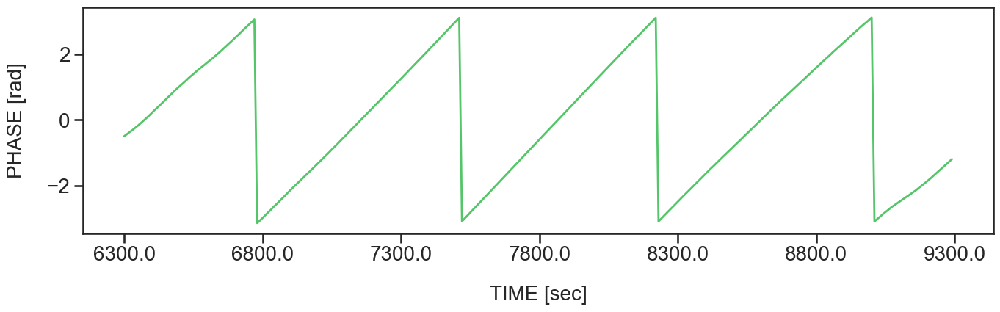

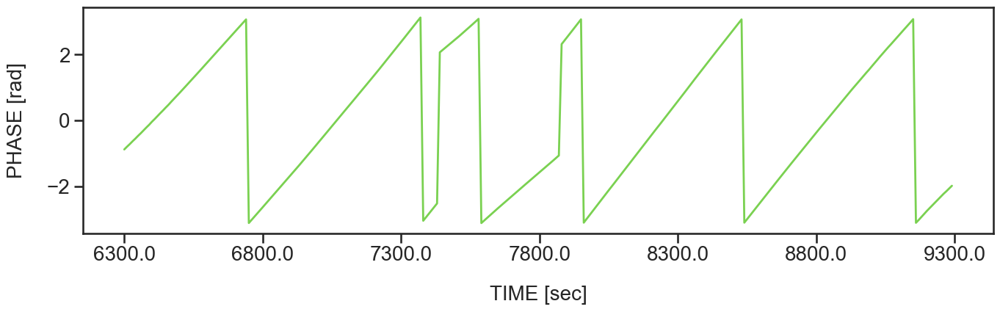

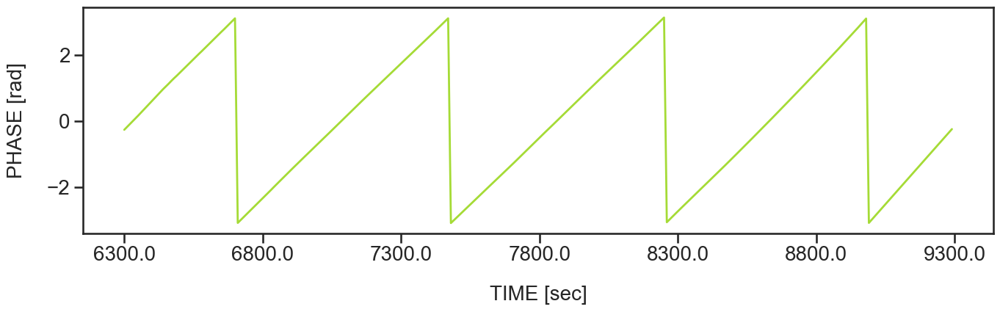

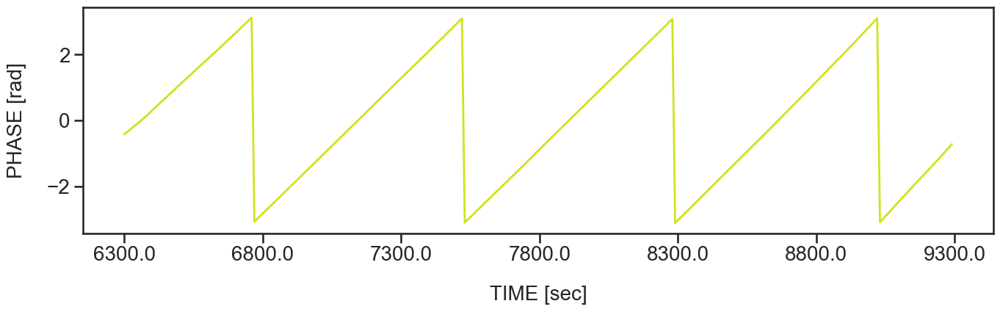

In [17]:
# plot separate phase timeseries for each sample

sample_color = sns.color_palette("viridis",ncolors).as_hex()
    
for j in range(len(data.columns)-1):
    
    ppl.figure(figsize=(16,4)) # default size is 8,6
    ax = ppl.gca()
    
    ax.plot(allphases.iloc[:,j], '-', lw = 2, alpha = 1, color=sample_color[j])
    ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
    ax.set_ylabel('PHASE [rad]', labelpad = 20, fontsize = 20)
    ax.tick_params(axis='both', labelsize = 20)
    #ax.set_xlim([0,endpoint])
    #ax.set_ylim([min_value,max_value])
    ax.set_xticklabels((ax.get_xticks()*dt)+startpoint)

    
    if sample_num < 10:
        ppl.savefig(str(directory) + 'phase/phaseSingleSample' + '_00' + str(sample_num) + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')
    else:
        ppl.savefig(str(directory) + 'phase/phaseSingleSample' + '_0' + str(sample_num)  + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

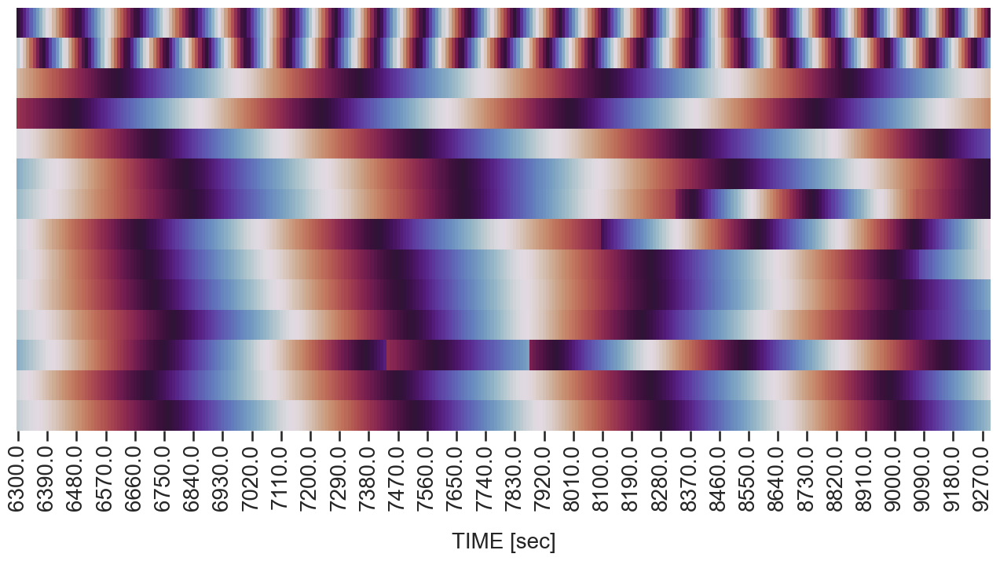

In [18]:
# phase as heatmap

allphases_transposed = allphases.transpose()

ppl.figure(figsize = (16, 0.5*num_samples))
ppl.clf()
ax = ppl.gca()

ax = sns.heatmap(allphases_transposed, cbar=False, cmap="twilight_shifted")
ax.set_yticks([])
ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax.tick_params(axis='both', labelsize = 20)
ax.set_xticklabels((ax.get_xticks()*dt)+startpoint-5) # - 5 because tickbox is placed in middle of a box for a timepoint (e.g. between observation 1 and observation 2), not accurate because no observation there

ppl.savefig(str(directory) + 'phase/phaseHeatmap' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

In [19]:
print("IGNORE THIS IF WISH TO PROCEED TO NEXT CHUNKS OF CODE")
STOP # ignore if wish to proceed to next chunks of code

IGNORE THIS IF WISH TO PROCEED TO NEXT CHUNKS OF CODE


NameError: name 'STOP' is not defined

## Customizable section for specifying samples from different conditions

The following sections contain chunks of customizable code to specify properties (e.g. line color) to differentiate samples from different conditions.

In [20]:
# for sample data, n = 2 for condition 1 (golfish), n = 2 for condition 2 (carp), n = 10, for condition 3 (zebrafish)

num_samples = len(allDetrended.columns)
sample_color = ["magenta",
                "magenta",
                "royalblue",
                "royalblue",
                "lime",
                "lime",
                "lime",
                "lime",
                "lime",
                "lime",
                "lime",
                "lime",
                "lime",
                "lime"] # specify color per condition (e.g. magenta for goldfish, royal blue for carp, and limegreen for zebrafish)

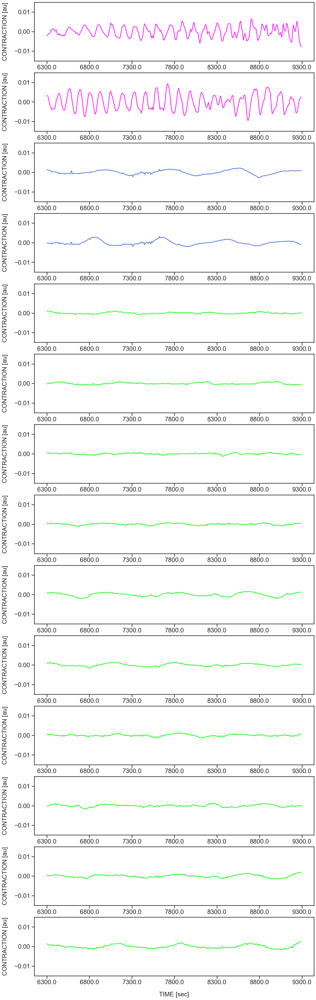

In [21]:
# separate detrended timeseries, e.g. colors = fish species

f1,axs = ppl.subplots(num_samples,1, sharex = False, figsize = (16,4*num_samples), num = 1)	# figure with subplots (x,y) - x rows and y columns

for i in range(num_samples):
    
    ax = axs[i]
    ax.plot(allDetrended.iloc[:,i], '-', lw = 2, alpha = 1, color=sample_color[i])
    ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
    ax.set_ylabel('CONTRACTION [au]', labelpad = 20, fontsize = 20)
    ax.tick_params(axis='both', labelsize = 20)
    #ax.set_xlim([0,endpoint])
    ax.set_ylim([min_value,max_value])
    ax.set_xticklabels((DETRENDax.get_xticks()*dt)+startpoint)

ppl.savefig(str(directory) + 'detrended_scale/separateDetrendedTimeseries-specifiedColors' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

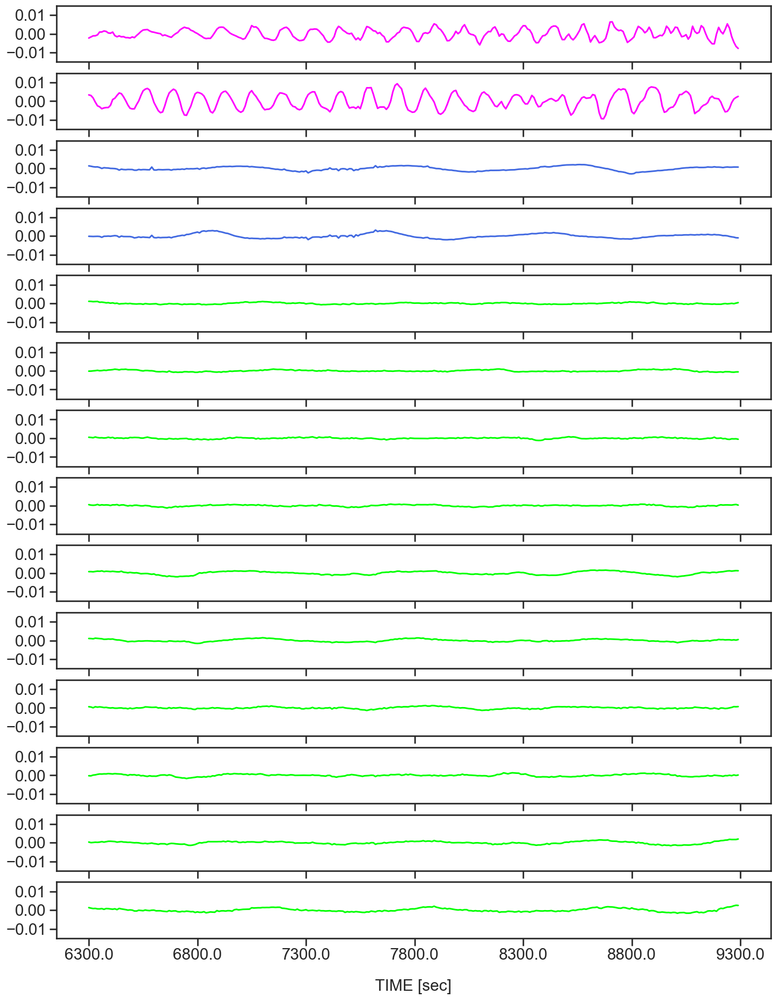

In [22]:
# same as above but different aspect ratio
# separate detrended timeseries, e.g. colors = fish species

f1,axs = ppl.subplots(num_samples,1, sharex = False, figsize = (16,1.5*num_samples), num = 1)	# figure with subplots (x,y) - x rows and y columns

for i in range(num_samples):
    
    if i == num_samples - 1:
        
        ax = axs[i]
        ax.plot(allDetrended.iloc[:,i], '-', lw = 2, alpha = 1, color=sample_color[i])
        ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
        #ax.set_ylabel('CONTRACTION [au]', labelpad = 20, fontsize = 20)
        ax.tick_params(axis='both', labelsize = 20)
        #ax.set_xlim([0,endpoint])
        ax.set_ylim([min_value,max_value])
        ax.set_xticklabels((DETRENDax.get_xticks()*dt)+startpoint)
    
    else:
        
        ax = axs[i]
        ax.plot(allDetrended.iloc[:,i], '-', lw = 2, alpha = 1, color=sample_color[i])
        #ax.set_ylabel('CONTRACTION [au]', labelpad = 20, fontsize = 20)
        ax.tick_params(axis='both', labelsize = 20)
        #ax.set_xlim([0,endpoint])
        ax.set_ylim([min_value,max_value])
        ax.set_xticklabels("")
        
ppl.savefig(str(directory) + 'detrended_scale/separateDetrendedTimeseries-specifiedColors-diffAspectRatio' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

<Figure size 640x480 with 0 Axes>

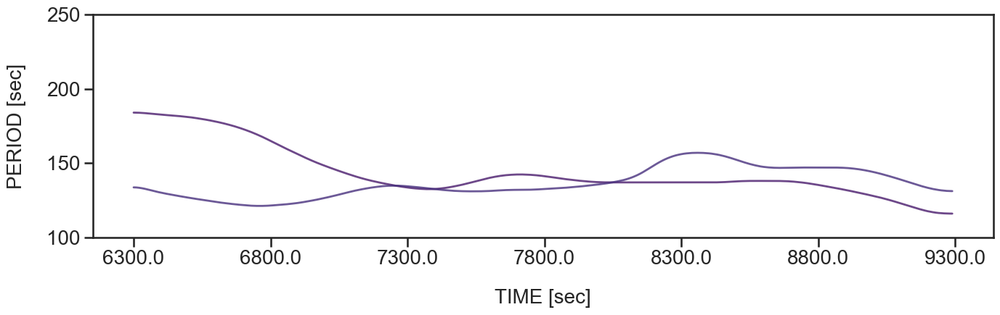

In [23]:
# specify limits of period y-axis from 100 seconds to 250 seconds

fig = ppl.figure(1)
ppl.figure(figsize=(16,4)) # default size is 8,6
ppl.clf()
ax = ppl.gca()

ax.plot(allTs, label = col, lw = 2, alpha = 0.8)
#ax.legend(ncol = 3)
ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax.set_ylim([100,250]) # change minimum and maximum y value, period, plotted
ax.tick_params(axis='both', labelsize = 20)
ax.set_xticklabels(ax.get_xticks()*dt+startpoint)

savefig(str(directory) + 'period/periodEvolution100250' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

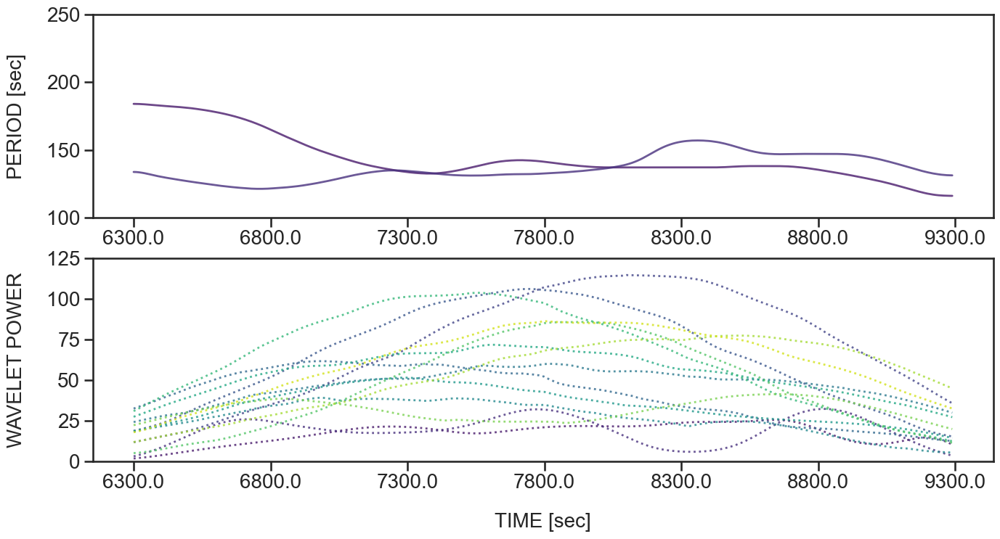

In [24]:
# specify limits of period y-axis from 100 seconds to 250 seconds
# with instantaneous wavelet power

f1,axs = ppl.subplots(2,1, sharex = False, figsize = (16,8), num = 1) # figure with subplots (x,y) - x rows and y columns

ax1 = axs[0]
ax2 = axs[1]

ax1.plot(allTs, label = col, lw = 2, alpha = 0.8)
#ax.legend(ncol = 3)
ax1.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylim([100,250]) # change minimum and maximum y value, period, plotted
ax1.tick_params(axis='both', labelsize = 20)
ax1.set_xticklabels(ax1.get_xticks()*dt+startpoint)

ax2.plot(allPs, ":", label = col, lw = 2, alpha = 0.8)
#ax2.legend(ncol = 3)
ax2.set_ylabel('WAVELET POWER', labelpad = 20, fontsize = 20)
ax2.set_ylim([0,125])
ax2.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax2.set_xticklabels(ax2.get_xticks()*dt+startpoint)
ax2.tick_params(axis='both', labelsize = 20)

savefig(str(directory) + 'period/periodEvolution100200+waveletPower' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

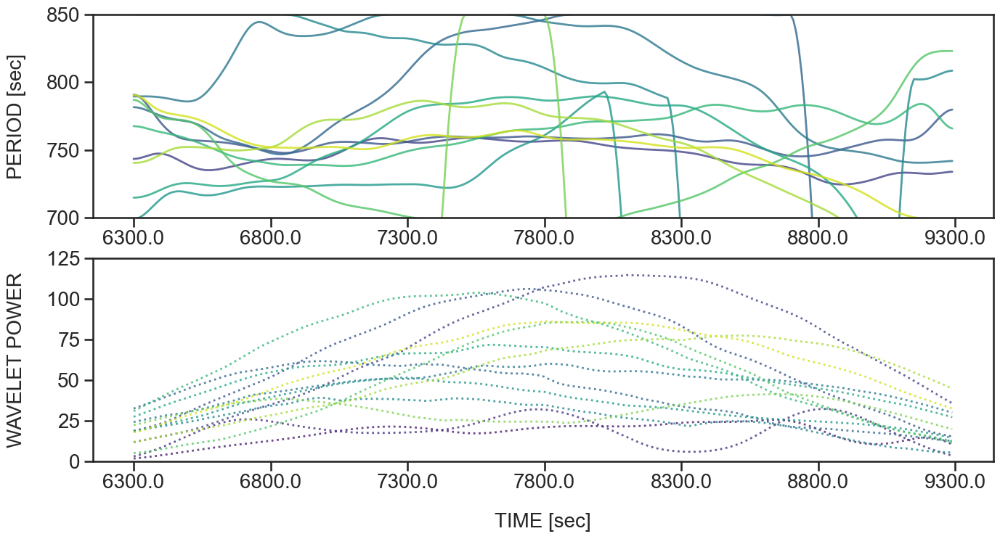

In [25]:
# specify limits of period y-axis from 700 seconds to 850 seconds
# with instantaneous wavelet power, y-axis set from 0 to 125

f1,axs = ppl.subplots(2,1, sharex = False, figsize = (16,8), num = 1) # figure with subplots (x,y) - x rows and y columns

ax1 = axs[0]
ax2 = axs[1]

ax1.plot(allTs, label = col, lw = 2, alpha = 0.8)
#ax.legend(ncol = 3)
ax1.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylim([700,T_c]) # change minimum and maximum y value, period, plotted
ax1.tick_params(axis='both', labelsize = 20)
ax1.set_xticklabels(ax1.get_xticks()*dt+startpoint)

ax2.plot(allPs, ":", label = col, lw = 2, alpha = 0.8)
#ax2.legend(ncol = 3)
ax2.set_ylabel('WAVELET POWER', labelpad = 20, fontsize = 20)
ax2.set_ylim([0,125])
ax2.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax2.set_xticklabels(ax2.get_xticks()*dt+startpoint)
ax2.tick_params(axis='both', labelsize = 20)

savefig(str(directory) + 'period/periodEvolution700850+waveletPower0125' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

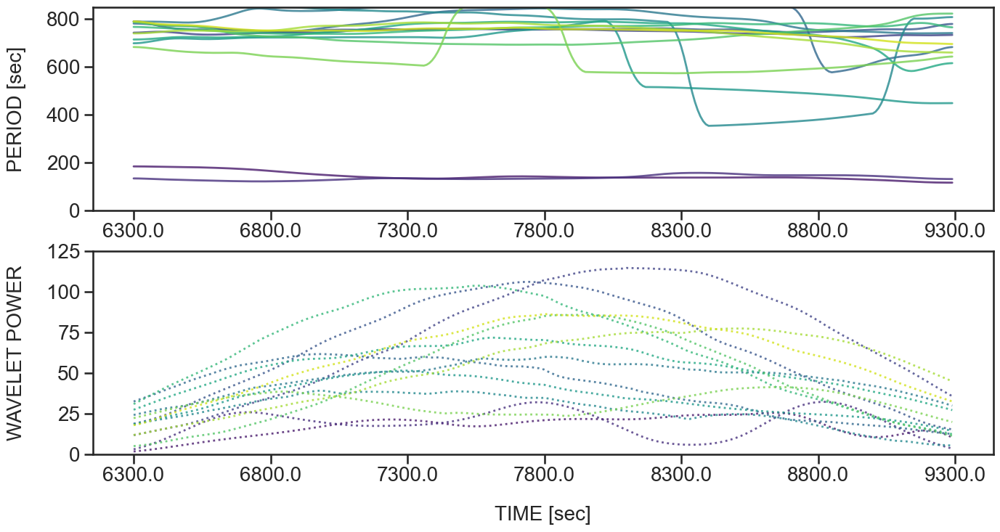

In [26]:
# plot period and wavelet power of all, different samples = different colors

f1,axs = ppl.subplots(2,1, sharex = False, figsize = (16,8), num = 1) # figure with subplots (x,y) - x rows and y columns

ax1 = axs[0]
ax2 = axs[1]

ax1.plot(allTs, label = col, lw = 2, alpha = 0.8)
#ax.legend(ncol = 3)
ax1.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylim([0,T_c]) # change minimum and maximum y value, period, plotted
ax1.tick_params(axis='both', labelsize = 20)
ax1.set_xticklabels(ax1.get_xticks()*dt+startpoint)

ax2.plot(allPs, ":", label = col, lw = 2, alpha = 0.8)
#ax2.legend(ncol = 3)
ax2.set_ylabel('WAVELET POWER', labelpad = 20, fontsize = 20)
ax2.set_ylim([0,125])
ax2.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax2.set_xticklabels(ax2.get_xticks()*dt+startpoint)
ax2.tick_params(axis='both', labelsize = 20)

savefig(str(directory) + 'period/periodEvolution+waveletPower' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

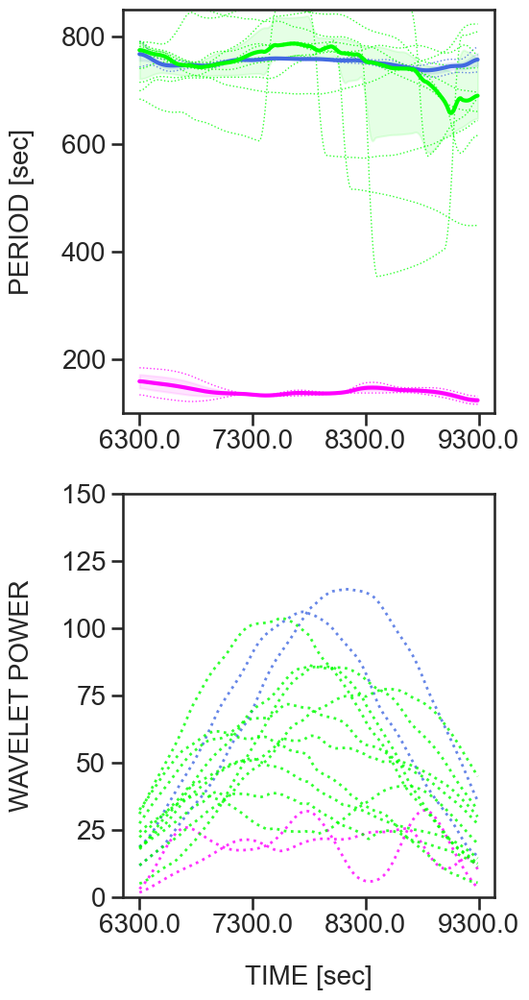

In [27]:
# same as above but different colors for different conditions

f1,axs = ppl.subplots(2,1, sharex = False, figsize = (5,12), num = 1) # figure with subplots (x,y) - x rows and y columns

ax1 = axs[0]
ax2 = axs[1]

# SPECIFY, n = 2 for condition 1, n = 2 for condition 2, n = 10, for condition 3

allTs1_q1 = allTs.iloc[:,:2].quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs1_q3 = allTs.iloc[:,:2].quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs1_med = allTs.iloc[:,:2].quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs1_q1 = savgol_filter(allTs1_q1, 13,3)
allTs1_q3 = savgol_filter(allTs1_q3, 13,3)
allTs1_med = savgol_filter(allTs1_med, 13,3)

allTs2_q1 = allTs.iloc[:,2:4].quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs2_q3 = allTs.iloc[:,2:4].quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs2_med = allTs.iloc[:,2:4].quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs2_q1 = savgol_filter(allTs2_q1, 13,3)
allTs2_q3 = savgol_filter(allTs2_q3, 13,3)
allTs2_med = savgol_filter(allTs2_med, 13,3)

allTs3_q1 = allTs.iloc[:,4:].quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs3_q3 = allTs.iloc[:,4:].quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs3_med = allTs.iloc[:,4:].quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs3_q1 = savgol_filter(allTs3_q1, 13,3)
allTs3_q3 = savgol_filter(allTs3_q3, 13,3)
allTs3_med = savgol_filter(allTs3_med, 13,3)

for sample in range(len(allTs.columns)):
    
    if sample < 2: # SPECIFY (e.g. for condition 1 = goldfish)
        
        ax1.plot(allTs.iloc[:,sample], ":", label = col, lw = 1, alpha = 0.8, color = "magenta")
        ax2.plot(allPs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "magenta")
    
    if 1 < sample < 4: # SPECIFY (e.g. for condition 2 = carp)
        
        ax1.plot(allTs.iloc[:,sample], ":", label = col, lw = 1, alpha = 0.8, color = "royalblue")
        ax2.plot(allPs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "royalblue")
    
    if sample > 3: # SPECIFY (e.g. for condition 3 = zebrafish)
        
        ax1.plot(allTs.iloc[:,sample], ":", label = col, lw = 1, alpha = 0.8, color = "lime")
        ax2.plot(allPs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "lime")
        
        
#ax1.plot(allTs, label = col, lw = 2, alpha = 0.8)
#ax.legend(ncol = 3)
ax1.plot(allTs1_med, '-', c = 'magenta', alpha = 1.0, lw = 3)
ax1.fill_between(arange(len(allTs1_q1)), allTs1_q1, allTs1_q3, alpha = 0.1, color = 'magenta') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax1.plot(allTs2_med, '-', c = 'royalblue', alpha = 1.0, lw = 3)
ax1.fill_between(arange(len(allTs2_q1)), allTs2_q1, allTs2_q3, alpha = 0.1, color = 'royalblue') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax1.plot(allTs3_med, '-', c = 'lime', alpha = 1.0, lw = 3)
ax1.fill_between(arange(len(allTs3_q1)), allTs3_q1, allTs3_q3, alpha = 0.1, color = 'lime') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
#ax1.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax1.set_ylim([100,T_c]) # change minimum and maximum y value, period, plotted
#ax1.set_xlim([0,1000]) # change minimum and maximum x value, time, plotted
ax1.tick_params(axis='both', labelsize = 20)
ax1.set_xticklabels(ax1.get_xticks()*dt+startpoint)

#ax2.plot(allPs, ":", label = col, lw = 2, alpha = 0.8)
#ax2.legend(ncol = 3)
ax2.set_ylabel('WAVELET POWER', labelpad = 20, fontsize = 20)
ax2.set_ylim([0,150])
#ax2.set_xlim([0,1000]) # change minimum and maximum x value, time, plotted
ax2.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax2.set_xticklabels(ax1.get_xticks()*dt+startpoint)
ax2.tick_params(axis='both', labelsize = 20)

savefig(str(directory) + 'period/periodEvolution+waveletPower_time01000' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

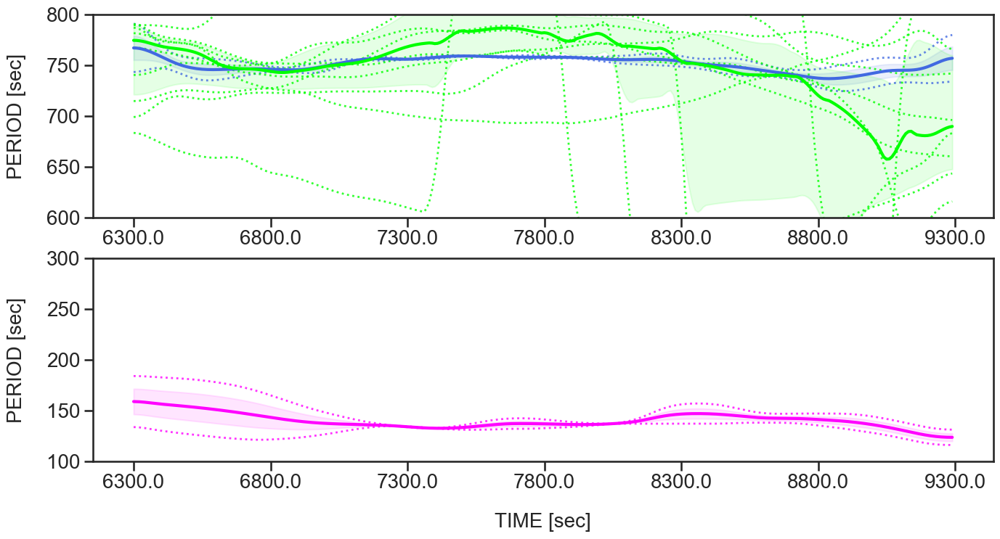

In [28]:
# two period ranges

f2,axs1 = ppl.subplots(2,1, sharex = False, figsize = (16,8), num = 1) # figure with subplots (x,y) - x rows and y columns

ax5 = axs1[0]
ax6 = axs1[1]

# SPECIFY, n = 2 for condition 1, n = 2 for condition 2, n = 10, for condition 3

allTs1_q1 = allTs.iloc[:,:2].quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs1_q3 = allTs.iloc[:,:2].quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs1_med = allTs.iloc[:,:2].quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs1_q1 = savgol_filter(allTs1_q1, 13,3)
allTs1_q3 = savgol_filter(allTs1_q3, 13,3)
allTs1_med = savgol_filter(allTs1_med, 13,3)

allTs2_q1 = allTs.iloc[:,2:4].quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs2_q3 = allTs.iloc[:,2:4].quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs2_med = allTs.iloc[:,2:4].quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs2_q1 = savgol_filter(allTs2_q1, 13,3)
allTs2_q3 = savgol_filter(allTs2_q3, 13,3)
allTs2_med = savgol_filter(allTs2_med, 13,3)

allTs3_q1 = allTs.iloc[:,4:].quantile(q = 0.25, axis = 1) # first quartile of all periods (Ts)
allTs3_q3 = allTs.iloc[:,4:].quantile(q = 0.75, axis = 1) # third quartile of all periods (Ts)
allTs3_med = allTs.iloc[:,4:].quantile(q = 0.5, axis = 1) # second quartile = median of all periods (Ts)

allTs3_q1 = savgol_filter(allTs3_q1, 13,3)
allTs3_q3 = savgol_filter(allTs3_q3, 13,3)
allTs3_med = savgol_filter(allTs3_med, 13,3)

for sample in range(len(allTs.columns)):
    
    if sample < 2: # SPECIFY (e.g. for condition 1 = goldfish)
        
        ax5.plot(allTs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "magenta")
        ax6.plot(allTs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "magenta")
    
    if 1 < sample < 4: # SPECIFY (e.g. for condition 2 = carp)
        
        ax5.plot(allTs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "royalblue")
        ax6.plot(allTs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "royalblue")
    
    if sample > 3: # SPECIFY (e.g. for condition 3 = zebrafish)
        
        ax5.plot(allTs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "lime")
        ax6.plot(allTs.iloc[:,sample], ":", label = col, lw = 2, alpha = 0.8, color = "lime")
        
        
#ax1.plot(allTs, label = col, lw = 2, alpha = 0.8)
#ax.legend(ncol = 3)
ax5.plot(allTs1_med, '-', c = 'magenta', alpha = 1.0, lw = 3)
ax5.fill_between(arange(len(allTs1_q1)), allTs1_q1, allTs1_q3, alpha = 0.1, color = 'magenta') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax5.plot(allTs2_med, '-', c = 'royalblue', alpha = 1.0, lw = 3)
ax5.fill_between(arange(len(allTs2_q1)), allTs2_q1, allTs2_q3, alpha = 0.1, color = 'royalblue') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax5.plot(allTs3_med, '-', c = 'lime', alpha = 1.0, lw = 3)
ax5.fill_between(arange(len(allTs3_q1)), allTs3_q1, allTs3_q3, alpha = 0.1, color = 'lime') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax5.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax5.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax5.set_ylim([600,800]) # change minimum and maximum y value, period, plotted
#ax1.set_xlim([0,1000]) # change minimum and maximum x value, time, plotted
ax5.tick_params(axis='both', labelsize = 20)
ax5.set_xticklabels(ax3.get_xticks()*dt+startpoint)

ax6.plot(allTs1_med, '-', c = 'magenta', alpha = 1.0, lw = 3)
ax6.fill_between(arange(len(allTs1_q1)), allTs1_q1, allTs1_q3, alpha = 0.1, color = 'magenta') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax6.plot(allTs2_med, '-', c = 'royalblue', alpha = 1.0, lw = 3)
ax6.fill_between(arange(len(allTs2_q1)), allTs2_q1, allTs2_q3, alpha = 0.1, color = 'royalblue') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax6.plot(allTs3_med, '-', c = 'lime', alpha = 1.0, lw = 3)
ax6.fill_between(arange(len(allTs3_q1)), allTs3_q1, allTs3_q3, alpha = 0.1, color = 'lime') # can add (, label = 'LABEL') inside parentheses (after 'blue') to specify label
ax6.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax6.set_ylabel('PERIOD [sec]', labelpad = 20, fontsize = 20)
ax6.set_ylim([100,300]) # change minimum and maximum y value, period, plotted
ax6.tick_params(axis='both', labelsize = 20)
ax6.set_xticklabels(ax4.get_xticks()*dt+startpoint)

savefig(str(directory) + 'period/periodEvolution2yAxes_time01000' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

## Chunks of code to determine Kuramoto first order parameter (measure of synchrony)

The following chunks of code determine the order parameter based on phases of ALL the samples (not separated by different conditions, if any). 

NOTE: this order parameter is a measure of in-phase synchrony, be careful when interpreting results because timeseries of contraction was taken from mean pixel value of fish embryo (or egg, if unfertilized) ~ projected area of the yolk, phase values are not directly comparable between samples.

<Figure size 640x480 with 0 Axes>

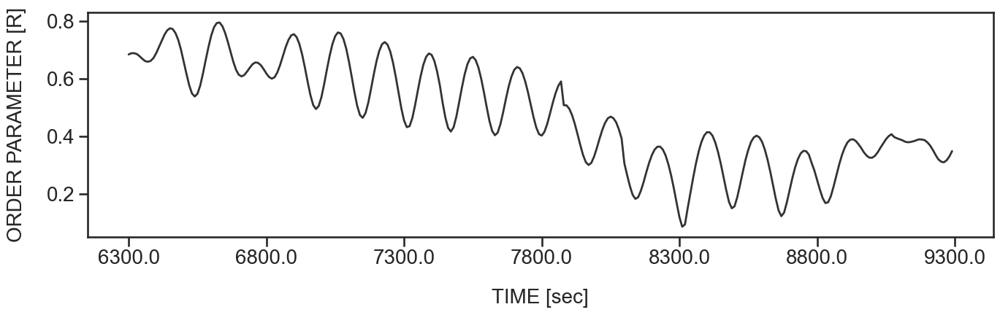

In [29]:
# to export order parameter over time

order_parameter = [] # array with order parameter across time
for time in range(len(allphases)):
    allphases_time = allphases.iloc[time,:]
    order_parameter_time = order_par(allphases_time)
    order_parameter.append(order_parameter_time)
order_parameter = pd.DataFrame(data=order_parameter) # dataframe with order parameter across time

order_parameter.to_csv(str(directory) + 'order_parameter/orderParameter_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.csv')

fig = ppl.figure(1)
ppl.figure(figsize=(16,4)) # default size is 8,6
ppl.clf()
ax = ppl.gca()

ax.plot(order_parameter, color='k', lw=2, alpha=0.8)
ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax.set_ylabel('ORDER PARAMETER [R]', labelpad = 20, fontsize = 20)
ax.tick_params(axis='both', labelsize = 20)
ax.set_xticklabels((ax.get_xticks()*dt)+startpoint)

savefig(str(directory) + 'order_parameter/orderParameter_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')


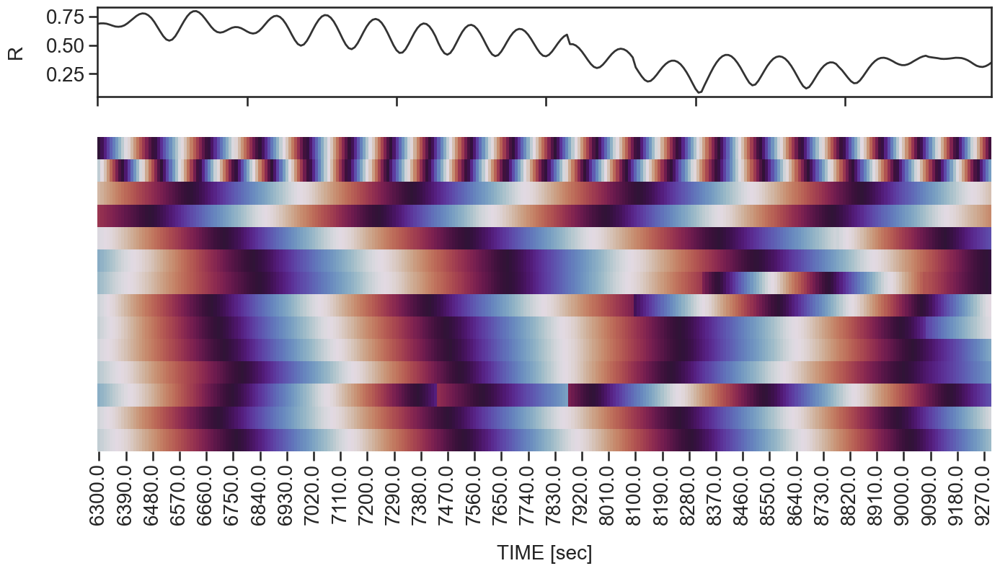

In [30]:
f1,axs = ppl.subplots(2,1, sharex = False, figsize = (16,(0.5*num_samples+1)), num = 1, gridspec_kw={'height_ratios': [2,0.5*num_samples]}) # figure with subplots (x,y) - x rows and y columns

ax1 = axs[0]
ax2 = axs[1]

ax1.plot(order_parameter, color='k', lw=2, alpha=0.8)
ax1.set_ylabel('R', labelpad = 20, fontsize = 20)
ax1.tick_params(axis='y', labelsize = 20)
ax1.set_xlim([0,endpoint-1])
ax1.set_xticklabels("")

ax2 = sns.heatmap(allphases_transposed, cbar=False, cmap="twilight_shifted")
ax2.set_yticks([])
ax2.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax2.tick_params(axis='both', labelsize = 20)
ax2.set_xticklabels((ax2.get_xticks()*dt)+startpoint-5) # - 5 because tickbox is placed in middle of a box for a timepoint (e.g. between observation 1 and observation 2), not accurate because no observation there
                      
ppl.savefig(str(directory) + 'phase/phase+orderParameter' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

<Figure size 640x480 with 0 Axes>

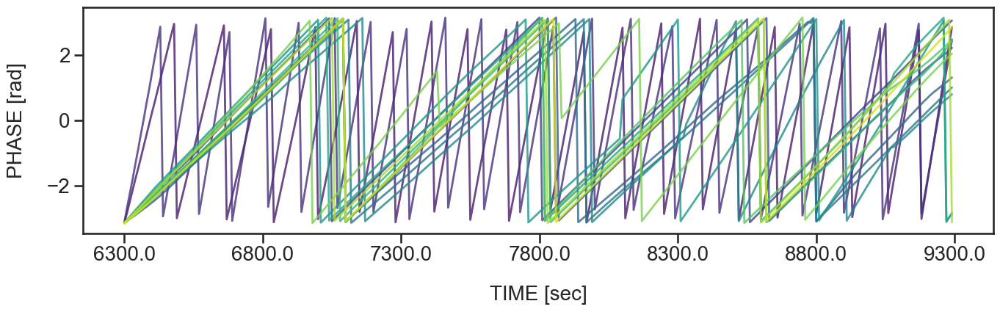

In [31]:
adjusted_phase = pd.DataFrame(data=allphases) # phase adjusted such that all samples start from same specified phase

for sample in range(len(allphases.columns)):
    
    start_phaseDiff = allphases.iloc[0,0] - allphases.iloc[0,sample]
    phaseDiff = (np.arctan2(np.sin(start_phaseDiff),np.cos(start_phaseDiff))) # in -pi to pi
    
    for timepoint in range(len(allphases)):
        
        adjusted_phase.iloc[timepoint,sample] = allphases.iloc[timepoint,sample] + phaseDiff # so initial phases are the same because area as proxy of contraction is relative to sample
        adjusted_phase.iloc[timepoint,sample] = (np.arctan2(np.sin(adjusted_phase.iloc[timepoint,sample]),np.cos(adjusted_phase.iloc[timepoint,sample])))      
        
# export adjusted phase timeseries
adjusted_phase.to_csv(str(directory) + 'phase/adjPhase_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.csv')

fig = ppl.figure(1)
ppl.figure(figsize=(16,4)) # default size is 8,6
ppl.clf()
PHASEax = ppl.gca()

PHASEax.plot(adjusted_phase, lw=2, alpha=0.8)
PHASEax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
PHASEax.set_ylabel('PHASE [rad]', labelpad = 20, fontsize = 20)
PHASEax.tick_params(axis='both', labelsize = 20)
PHASEax.set_xticklabels((PHASEax.get_xticks()*dt)+startpoint)

savefig(str(directory) + 'phase/adjPhase_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')

In [32]:
adjusted_phase

,Process_69a,Process_69b,Process_96-97a,Process_96-97b,Process_131a,Process_131b,Process_131c,Process_131d,Process_131e,Process_131f,Process_131g,Process_131h,Process_131i,Process_131j
0,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872,-3.138872
1,-2.826872,-2.671996,-3.049171,-3.072701,-3.069432,-3.057260,-3.067374,-3.049897,-3.051992,-3.061458,-3.079569,-3.054253,-3.053983,-3.069536
2,-2.484587,-2.243214,-2.952457,-3.012704,-2.994365,-2.984370,-2.995904,-2.951104,-2.965250,-2.983822,-3.012895,-2.975073,-2.969315,-3.004932
3,-2.142387,-1.810308,-2.863324,-2.952018,-2.919248,-2.906769,-2.924563,-2.847271,-2.873105,-2.906506,-2.951480,-2.889720,-2.884931,-2.939326
4,-1.800260,-1.337740,-2.774588,-2.897534,-2.844436,-2.825661,-2.853418,-2.749425,-2.786914,-2.829716,-2.883996,-2.809438,-2.800859,-2.867509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,0.707236,0.542590,2.731336,1.928142,1.030039,0.673132,0.497642,2.904152,3.043070,1.989352,2.138171,1.714631,2.783095,2.467063
296,1.242190,1.021627,2.810513,1.997499,1.094110,0.752312,0.573760,3.042456,3.133108,2.090793,2.213963,1.798448,2.876434,2.560458
297,1.777443,1.501356,2.889824,2.065880,1.162467,0.835946,0.647019,-3.109879,-3.060751,2.192524,2.290192,1.875422,2.974225,2.654205
298,2.312946,1.981702,2.975733,2.139783,1.235366,0.919700,0.715721,-2.971738,-2.966306,2.295777,2.366857,1.958255,3.067416,2.748496


<Figure size 640x480 with 0 Axes>

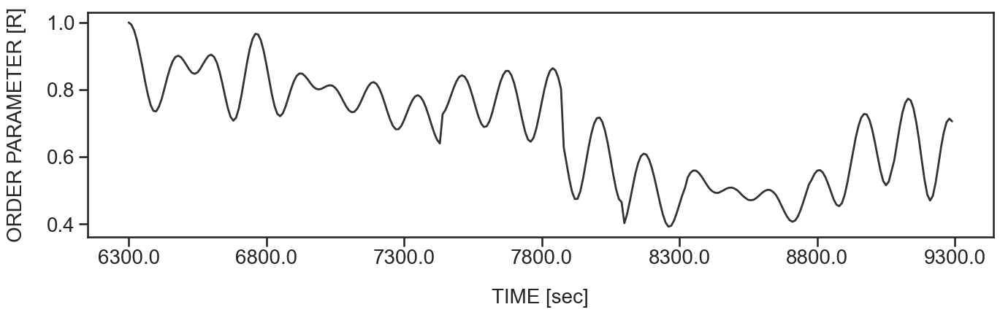

In [33]:
# to export order parameter over time for adjusted phase

order_parameter_adjPhase = [] # array with order parameter across time
for time in range(len(adjusted_phase)):
    allphases_time = adjusted_phase.iloc[time,:]
    order_parameter_time = order_par(allphases_time)
    order_parameter_adjPhase.append(order_parameter_time)
order_parameter_adjPhase = pd.DataFrame(data=order_parameter_adjPhase) # dataframe with order parameter across time

order_parameter_adjPhase.to_csv(str(directory) + 'order_parameter/orderParameter_adjPhase_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.csv')

fig = ppl.figure(1)
ppl.figure(figsize=(16,4)) # default size is 8,6
ppl.clf()
ax = ppl.gca()

ax.plot(order_parameter_adjPhase, color='k', lw=2, alpha=0.8)
ax.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax.set_ylabel('ORDER PARAMETER [R]', labelpad = 20, fontsize = 20)
ax.tick_params(axis='both', labelsize = 20)
ax.set_xticklabels((ax.get_xticks()*dt)+startpoint)

savefig(str(directory) + 'order_parameter/orderParameter_adjPhase_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')


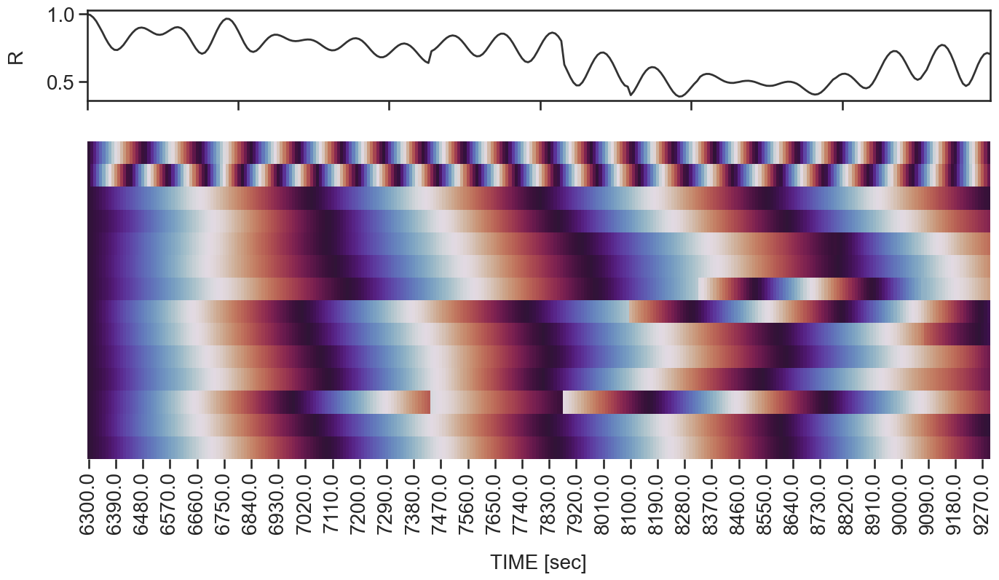

In [34]:
adjPhase_transposed = adjusted_phase.transpose()

f1,axs = ppl.subplots(2,1, sharex = False, figsize = (16,(0.5*num_samples+1)), num = 1, gridspec_kw={'height_ratios': [2,0.5*num_samples]}) # figure with subplots (x,y) - x rows and y columns

ax1 = axs[0]
ax2 = axs[1]

ax1.plot(order_parameter_adjPhase, color='k', lw=2, alpha=0.8)
ax1.set_ylabel('R', labelpad = 20, fontsize = 20)
ax1.tick_params(axis='y', labelsize = 20)
ax1.set_xlim([0,endpoint-1])
ax1.set_xticklabels("")

ax2 = sns.heatmap(adjPhase_transposed, cbar=False, cmap="twilight_shifted")
ax2.set_yticks([])
ax2.set_xlabel('TIME [sec]', labelpad = 20, fontsize = 20)
ax2.tick_params(axis='both', labelsize = 20)
ax2.set_xticklabels((ax2.get_xticks()*dt)+startpoint-5) # - 5 because tickbox is placed in middle of a box for a timepoint (e.g. between observation 1 and observation 2), not accurate because no observation there

                      
ppl.savefig(str(directory) + 'phase/adjPhase+orderParameter' + '_' + str(reporter) + '_' + str(drug_conc) + '.0' + str(drug) + '_' + str(sample_loc) + '.pdf', bbox_inches = 'tight')